# **Project : Deep learning-based Emotion Recognition from Facial Expressions**

In [ ]:
!pip install -q git+https://github.com/qubvel/classification_models.git

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 4.2 MB/s eta 0:00:00


In [ ]:
pip install tensorflow-addons

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 611.8/611.8 kB 35.3 MB/s eta 0:00:00
  Attempting uninstall: typeguard
    Found existing installation: typeguard 4.4.4
    Uninstalling typeguard-4.4.4:
      Successfully uninstalled typeguard-4.4.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
inflect 7.5.0 requires typeguard>=4.0.1, but you have typeguard 2.13.3 which is incompatible.


# **Import Required Libraries**

In [ ]:
# Standard library
import os
import time
import random
import shutil
import zipfile
import math
import hashlib
from collections import defaultdict
import matplotlib.pyplot as plt



# Scientific computing and data handling
import numpy as np
import pandas as pd

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Progress bar
from tqdm import tqdm

# PyTorch core
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

# PyTorch utilities
from torch.utils.data import DataLoader,random_split
from torch.optim.lr_scheduler import CosineAnnealingLR, LambdaLR
from torchsummary import summary

# Torchvision for datasets and models
import torchvision.transforms as transforms
import torchvision.datasets as datasets
import torchvision.models as models

# TensorFlow & Keras
import tensorflow as tf
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import (
    Input, Conv2D, MaxPooling2D, Dropout, Activation,
    BatchNormalization, Dense, GlobalAveragePooling2D,
    Flatten
)
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.callbacks import (
    EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
)
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import (
    ImageDataGenerator, load_img, img_to_array, array_to_img
)
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.applications import (
    InceptionResNetV2, InceptionV3, ResNet50
)

# Image processing
from PIL import Image

# Scikit-learn
from sklearn.preprocessing import label_binarize
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.utils import resample, class_weight
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import (
    classification_report, confusion_matrix,
    precision_recall_fscore_support, accuracy_score,roc_curve, auc,accuracy_score
)
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.models import load_model
from sklearn.metrics import confusion_matrix, classification_report
from classification_models.tfkeras import Classifiers
from tensorflow.keras.models import Model


# Confirm TensorFlow version
print("TensorFlow version:", tf.__version__)


TensorFlow version: 2.18.0


In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix, classification_report
from keras.regularizers import l2
from keras.layers import Conv2D, MaxPool2D, Dense, Dropout, BatchNormalization, GlobalAveragePooling2D, LeakyReLU
from tensorflow.keras.utils import plot_model
from IPython.display import Image



# **Mount Google Drive**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **Extract Dataset**

In [ ]:
zip_path = '/content/drive/MyDrive/DL Project/FER2013.zip'
extract_dir = '/content/Dataset'
os.makedirs(extract_dir, exist_ok=True)
# Unzip
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_dir)

print(f"Extracted to: {extract_dir}")

Extracted to: /content/Dataset


# **Path To Directories**

In [ ]:
train_dir = "/content/drive/MyDrive/MS Thesis Test Data/Final Dataset-Thesis/Train"
test_dir = "/content/drive/MyDrive/MS Thesis Test Data/Final Dataset-Thesis/Test"

# **Class Count**

In [ ]:
class_counts = {}
valid_extensions = ('.jpg', '.jpeg', '.png', '.bmp', '.gif')  # Add more if needed
for class_name in os.listdir(train_dir):
    if class_name == '.ipynb_checkpoints':
        continue
    class_path = os.path.join(train_dir, class_name)
    if os.path.isdir(class_path):
        image_files = [
            f for f in os.listdir(class_path)
            if f.lower().endswith(valid_extensions) and os.path.isfile(os.path.join(class_path, f))
        ]
        class_counts[class_name] = len(image_files)
print("Image count per emotion class (Original Dataset):")
for cls, count in class_counts.items():
    print(f"- {cls}: {count} images")


Image count per emotion class (Original Dataset):
- sadness: 111 images
- joy: 355 images
- Natural: 113 images
- Fear: 20 images
- Surprise: 18 images


# **Plot Class Count In Training Set**

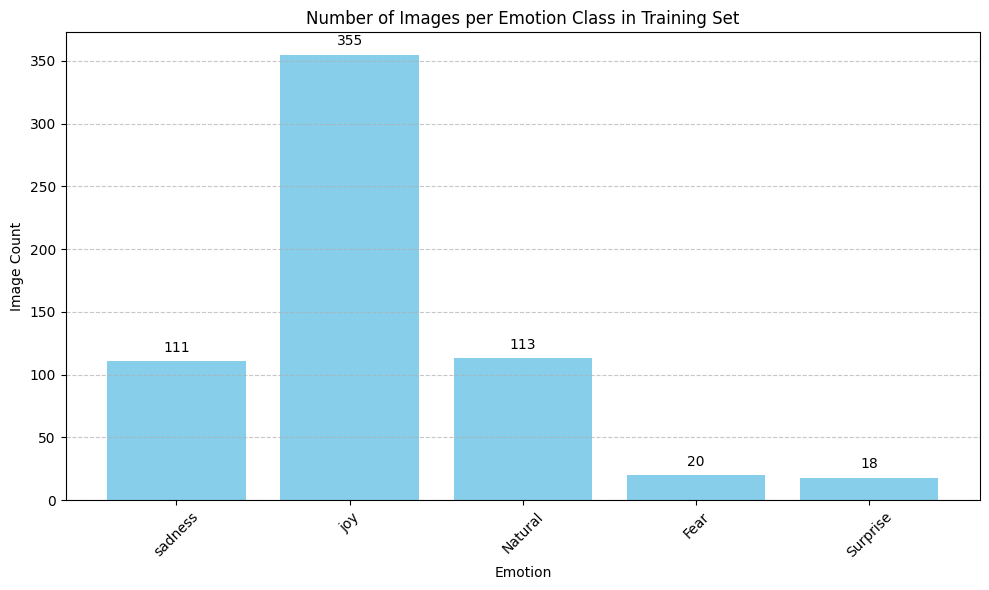

In [ ]:
plt.figure(figsize=(10, 6))
bars = plt.bar(class_counts.keys(), class_counts.values(), color='skyblue')
plt.title('Number of Images per Emotion Class in Training Set')
plt.xlabel('Emotion')
plt.ylabel('Image Count')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2.0, yval + 5, int(yval), ha='center', va='bottom')

plt.tight_layout()
plt.show()

# **Show Few Samples from Each Class**


Showing sample images from each class...


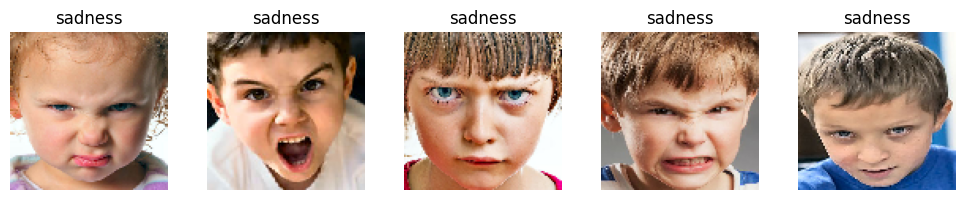

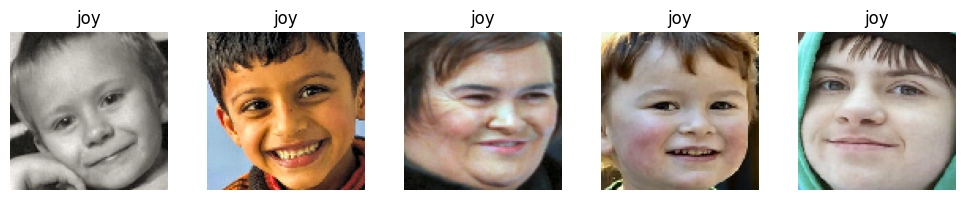

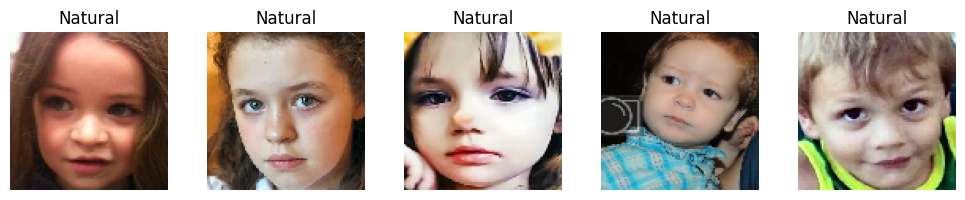

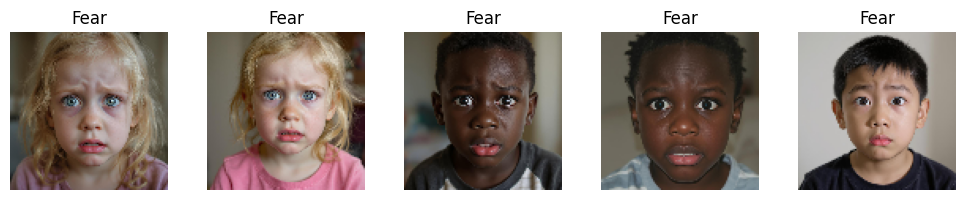

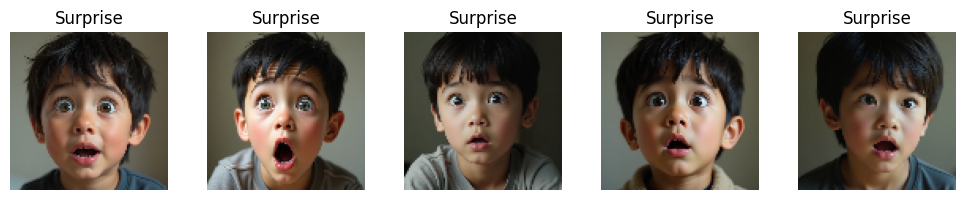

In [ ]:

print("\nShowing sample images from each class...")
for class_name in list(class_counts.keys())[:5]:
    class_path = os.path.join(train_dir, class_name)
    image_files = os.listdir(class_path)[:5]
    plt.figure(figsize=(10, 2))
    for i, img_name in enumerate(image_files):
        img_path = os.path.join(class_path, img_name)
        img = load_img(img_path, target_size=(100, 100))
        plt.subplot(1, 5, i+1)
        plt.imshow(img)
        plt.title(class_name)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# **Image Size Distribution**

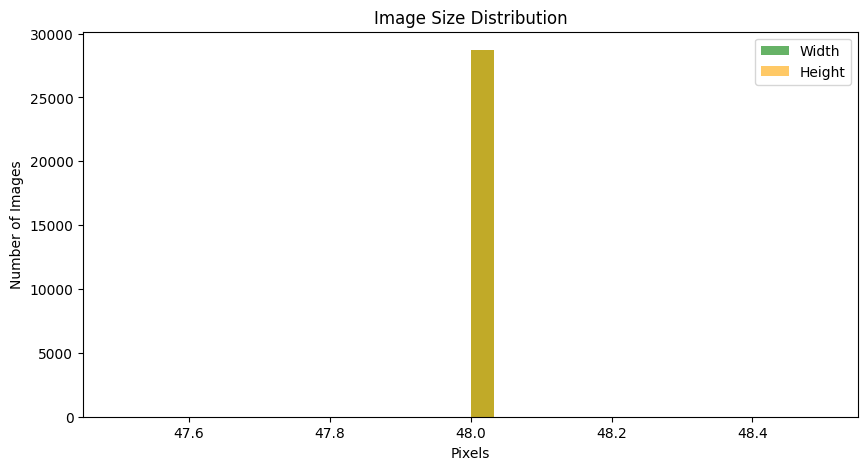


Image Size Summary:
- Total images analyzed: 28709
- Width: min = 48, max = 48, mean = 48.00
- Height: min = 48, max = 48, mean = 48.00


In [ ]:
image_sizes = []
valid_extensions = ('.jpg', '.jpeg', '.png', '.bmp', '.gif')

for cls in os.listdir(train_dir):
    if cls == '.ipynb_checkpoints':
        continue
    cls_path = os.path.join(train_dir, cls)
    for fname in os.listdir(cls_path):
        if fname.lower().endswith(valid_extensions):
            img_path = os.path.join(cls_path, fname)
            try:
                with Image.open(img_path) as img:
                    image_sizes.append(img.size)  # (width, height)
            except:
              pass
widths, heights = zip(*image_sizes)

# Plot histograms
plt.figure(figsize=(10, 5))
plt.hist(widths, bins=30, alpha=0.6, label='Width', color='green')
plt.hist(heights, bins=30, alpha=0.6, label='Height', color='orange')
plt.title("Image Size Distribution")
plt.xlabel("Pixels")
plt.ylabel("Number of Images")
plt.legend()
plt.show()

# Print statistics
print("\nImage Size Summary:")
print(f"- Total images analyzed: {len(image_sizes)}")
print(f"- Width: min = {min(widths)}, max = {max(widths)}, mean = {sum(widths)/len(widths):.2f}")
print(f"- Height: min = {min(heights)}, max = {max(heights)}, mean = {sum(heights)/len(heights):.2f}")


# **Custom CNN Model**

In [ ]:
import tensorflow as tf
import keras
from keras.layers import Conv2D, MaxPool2D, Flatten,Dense,Dropout,BatchNormalization
cnn_model2= tf.keras.models.Sequential()
cnn_model2.add(Conv2D(32, kernel_size=(5, 5), padding='same', activation='relu', input_shape=(48, 48,1)))
cnn_model2.add(Conv2D(64,(3,3), padding='same', activation='relu' ))
cnn_model2.add(BatchNormalization())
cnn_model2.add(MaxPool2D(pool_size=(2, 2)))
cnn_model2.add(Dropout(0.25))

cnn_model2.add(Conv2D(128,(5,5), padding='same', activation='relu'))
cnn_model2.add(BatchNormalization())
cnn_model2.add(MaxPool2D(pool_size=(2, 2)))
cnn_model2.add(Dropout(0.25))

cnn_model2.add(Conv2D(512,(3,3), padding='same', activation='relu'))
cnn_model2.add(BatchNormalization())
cnn_model2.add(MaxPool2D(pool_size=(2, 2)))
cnn_model2.add(Dropout(0.25))
cnn_model2.add(Conv2D(512,(3,3), padding='same', activation='relu'))
cnn_model2.add(BatchNormalization())
cnn_model2.add(MaxPool2D(pool_size=(2, 2)))
cnn_model2.add(Dropout(0.25))

cnn_model2.add(Flatten())
cnn_model2.add(Dense(256,activation = 'relu'))
cnn_model2.add(BatchNormalization())
cnn_model2.add(Dropout(0.25))

cnn_model2.add(Dense(512,activation = 'relu'))
cnn_model2.add(BatchNormalization())
cnn_model2.add(Dropout(0.25))

cnn_model2.add(Dense(5, activation='softmax'))

train_datagen = ImageDataGenerator(width_shift_range = 0.1,
                                         height_shift_range = 0.1,
                                         horizontal_flip = True,
                                         rescale = 1./255,
                                         validation_split = 0.2
                                        )
validation_datagen = ImageDataGenerator(rescale = 1./255,
                                         validation_split = 0.2)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
for i, layer in enumerate(cnn_model2.layers):
    print(f"{i}: {layer.name} ({layer.__class__.__name__})")

0: conv2d (Conv2D)
1: conv2d_1 (Conv2D)
2: batch_normalization (BatchNormalization)
3: max_pooling2d (MaxPooling2D)
4: dropout (Dropout)
5: conv2d_2 (Conv2D)
6: batch_normalization_1 (BatchNormalization)
7: max_pooling2d_1 (MaxPooling2D)
8: dropout_1 (Dropout)
9: conv2d_3 (Conv2D)
10: batch_normalization_2 (BatchNormalization)
11: max_pooling2d_2 (MaxPooling2D)
12: dropout_2 (Dropout)
13: conv2d_4 (Conv2D)
14: batch_normalization_3 (BatchNormalization)
15: max_pooling2d_3 (MaxPooling2D)
16: dropout_3 (Dropout)
17: flatten (Flatten)
18: dense (Dense)
19: batch_normalization_4 (BatchNormalization)
20: dropout_4 (Dropout)
21: dense_1 (Dense)
22: batch_normalization_5 (BatchNormalization)
23: dropout_5 (Dropout)
24: dense_2 (Dense)


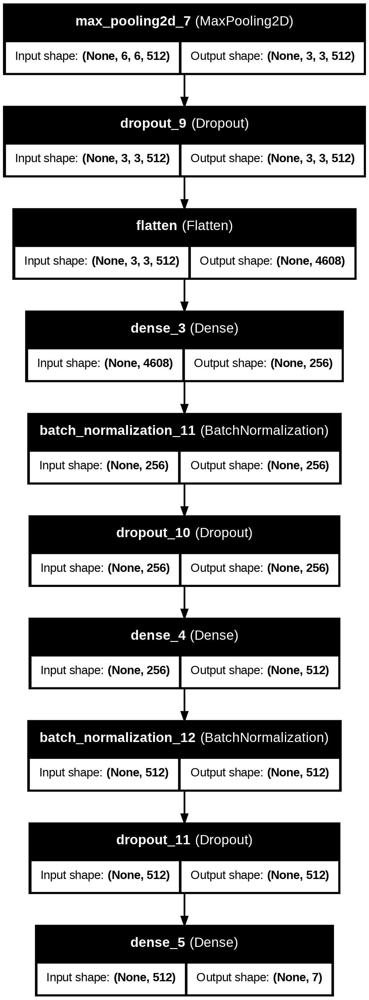

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import plot_model
from IPython.display import Image

# === PART 1 ===
part1 = Sequential(cnn_model2.layers[:7])
part1.build(input_shape=cnn_model2.input_shape)
plot_model(part1, to_file='/content/drive/MyDrive/DL Project/convnet2_part1.png',
           show_shapes=True, show_layer_names=True, rankdir='TB')
Image('/content/drive/MyDrive/DL Project/convnet2_part1.png')

# === PART 2 ===
part2 = Sequential()
for layer in cnn_model2.layers[7:15]:
    part2.add(layer)
# Build with output shape of part1
part2.build(input_shape=part1.output_shape)
plot_model(part2, to_file='/content/drive/MyDrive/DL Project/convnet2_part2.png',
           show_shapes=True, show_layer_names=True, rankdir='TB')
Image('/content/drive/MyDrive/DL Project/convnet2_part2.png')

# === PART 3 ===
part3 = Sequential()
for layer in cnn_model2.layers[15:]:
    part3.add(layer)
part3.build(input_shape=part2.output_shape)
plot_model(part3, to_file='/content/drive/MyDrive/DL Project/convnet2_part3.png',
           show_shapes=True, show_layer_names=True, rankdir='TB')
Image('/content/drive/MyDrive/DL Project/convnet2_part3.png')


In [ ]:
cnn_model2.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_20 (Conv2D)              │ (None, 48, 48, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_21 (Conv2D)              │ (None, 48, 48, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_24          │ (None, 48, 48, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_16 (MaxPooling2D) │ (None, 24, 24, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_24 (Dropout)            │ (None, 24, 24, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_22 (Conv2D)              │ (None, 24, 24, 128)    │       204,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_25          │ (None, 24, 24, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_17 (MaxPooling2D) │ (None, 12, 12, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_25 (Dropout)            │ (None, 12, 12, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_23 (Conv2D)              │ (None, 12, 12, 512)    │       590,336 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_26          │ (None, 12, 12, 512)    │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_18 (MaxPooling2D) │ (None, 6, 6, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_26 (Dropout)            │ (None, 6, 6, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_24 (Conv2D)              │ (None, 6, 6, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_27          │ (None, 6, 6, 512)      │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_19 (MaxPooling2D) │ (None, 3, 3, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_27 (Dropout)            │ (None, 3, 3, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_4 (Flatten)             │ (None, 4608)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 256)            │     1,179,904 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_28          │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_28 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 512)            │       131,584 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 4,496,905 (17.15 MB)

 Trainable params: 4,492,935 (17.14 MB)

 Non-trainable params: 3,968 (15.50 KB)

 Optimizer params: 2 (12.00 B)

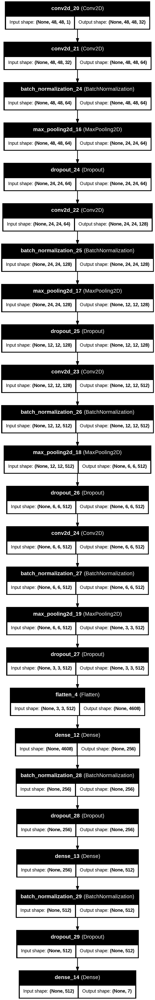

In [ ]:
from tensorflow.keras.utils import plot_model
from IPython.display import Image
plot_model(cnn_model2, to_file='convnet.png', show_shapes=True,show_layer_names=True)
Image(filename='convnet.png')
from google.colab import files
files.download('convnet.png')


# **Data Generators**

In [ ]:

img_size=(48,48)
bth_size=32

train_datagen = ImageDataGenerator(
   rescale=1.0/255,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True,  # Try vertical flip as well for more diversity
    validation_split=0.2
)
validation_datagen = ImageDataGenerator(rescale = 1./255,
                                         validation_split = 0.2)

In [ ]:

train_dir = "/content/drive/MyDrive/MS Thesis Test Data/Final Dataset-Thesis/Train"
test_dir = "/content/drive/MyDrive/MS Thesis Test Data/Final Dataset-Thesis/Test"
testdatagen = ImageDataGenerator(rescale=1.0/255)
train_generator = train_datagen.flow_from_directory(directory = train_dir,
                                                    target_size = (img_size,img_size),
                                                    batch_size = 32,
                                                    color_mode = "grayscale",
                                                    class_mode = "categorical",
                                                    subset = "training"
                                                   )
validation_generator = validation_datagen.flow_from_directory( directory = train_dir,
                                                              target_size = (img_size,img_size),
                                                              batch_size = 32,
                                                              color_mode = "grayscale",
                                                              class_mode = "categorical",
                                                              subset = "validation"
                                                             )

testgen = testdatagen.flow_from_directory(
    test_dir,
    target_size=img_size,
    batch_size=bth_size,
    color_mode='grayscale',
    class_mode='categorical',
    shuffle=False
)


Found 495 images belonging to 5 classes.
Found 122 images belonging to 5 classes.


TypeError: 'int' object is not iterable

In [ ]:
import tensorflow as tf
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.layers import Conv2D, MaxPool2D, Flatten, Dense, Dropout, BatchNormalization

# Build the CNN model
cnn_model2 = tf.keras.models.Sequential()
cnn_model2.add(Conv2D(32, kernel_size=(5, 5), padding='same', activation='relu', input_shape=(48, 48, 1)))
cnn_model2.add(Conv2D(64, (3, 3), padding='same', activation='relu'))
cnn_model2.add(BatchNormalization())
cnn_model2.add(MaxPool2D(pool_size=(2, 2)))
cnn_model2.add(Dropout(0.25))

cnn_model2.add(Conv2D(128, (5, 5), padding='same', activation='relu'))
cnn_model2.add(BatchNormalization())
cnn_model2.add(MaxPool2D(pool_size=(2, 2)))
cnn_model2.add(Dropout(0.25))

cnn_model2.add(Conv2D(512, (3, 3), padding='same', activation='relu'))
cnn_model2.add(BatchNormalization())
cnn_model2.add(MaxPool2D(pool_size=(2, 2)))
cnn_model2.add(Dropout(0.25))

cnn_model2.add(Conv2D(512, (3, 3), padding='same', activation='relu'))
cnn_model2.add(BatchNormalization())
cnn_model2.add(MaxPool2D(pool_size=(2, 2)))
cnn_model2.add(Dropout(0.25))

cnn_model2.add(Flatten())
cnn_model2.add(Dense(256, activation='relu'))
cnn_model2.add(BatchNormalization())
cnn_model2.add(Dropout(0.25))

cnn_model2.add(Dense(512, activation='relu'))
cnn_model2.add(BatchNormalization())
cnn_model2.add(Dropout(0.25))

# Output layer for 5 classes
cnn_model2.add(Dense(5, activation='softmax'))

# Image size and batch size
img_size = (48, 48)
batch_size = 32

# Data augmentation
train_datagen = ImageDataGenerator(
    rescale=1.0/255,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True,
    validation_split=0.2
)

validation_datagen = ImageDataGenerator(
    rescale=1.0/255,
    validation_split=0.2
)

test_datagen = ImageDataGenerator(rescale=1.0/255)

# Paths
train_dir = "/content/drive/MyDrive/MS Thesis Test Data/Final Dataset-Thesis/Train"
test_dir = "/content/drive/MyDrive/MS Thesis Test Data/Final Dataset-Thesis/Test"

# Data generators
train_generator = train_datagen.flow_from_directory(
    directory=train_dir,
    target_size=img_size,
    batch_size=batch_size,
    color_mode="grayscale",
    class_mode="categorical",
    subset="training"
)

validation_generator = validation_datagen.flow_from_directory(
    directory=train_dir,
    target_size=img_size,
    batch_size=batch_size,
    color_mode="grayscale",
    class_mode="categorical",
    subset="validation"
)

test_generator = test_datagen.flow_from_directory(
    directory=test_dir,
    target_size=img_size,
    batch_size=batch_size,
    color_mode="grayscale",
    class_mode="categorical",
    shuffle=False
)

# Compile model
cnn_model2.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Train model
epochs = 100
history = cnn_model2.fit(
    x=train_generator,
    epochs=epochs,
    validation_data=validation_generator
)

# Save model
cnn_model2.save("/content/drive/MyDrive/MS Thesis Test Data/cnn_model1_final.h5")


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Found 495 images belonging to 5 classes.
Found 122 images belonging to 5 classes.
Found 57 images belonging to 3 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 50s 2s/step - accuracy: 0.2585 - loss: 2.2635 - val_accuracy: 0.5820 - val_loss: 1.3655
Epoch 2/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 6s 336ms/step - accuracy: 0.3838 - loss: 1.9762 - val_accuracy: 0.5820 - val_loss: 1.3701
Epoch 3/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 5s 334ms/step - accuracy: 0.4098 - loss: 1.6868 - val_accuracy: 0.5820 - val_loss: 1.5665
Epoch 4/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 6s 387ms/step - accuracy: 0.4039 - loss: 1.5784 - val_accuracy: 0.5820 - val_loss: 4.0526
Epoch 5/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 5s 333ms/step - accuracy: 0.4701 - loss: 1.4356 - val_accuracy: 0.5820 - val_loss: 2.5039
Epoch 6/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 6s 410ms/step - accuracy: 0.4952 - loss: 1.3794 - val_accuracy: 0.5820 - val_loss: 2.7707
Epoch 7/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 5s 322ms/step - accuracy: 0.5477 - loss: 1.2785 - val_accuracy: 0.5820 - val_loss: 1.8176
Epoch 8/100
16/16 ━━━━━━━━━━━━━━━━━━━━ 6s 376ms/step - accuracy: 0.5426 - loss: 1.2666 - val_accura

In [ ]:

cnn_model2.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

epochs = 100
batch_size = 32
history = cnn_model2.fit(
    x=train_generator,
    epochs=epochs,
    validation_data=validation_generator
)
cnn_model2.save("C:/Users/musta/Desktop/Areeba/cnn_model1_final.h5")

TypeError: 'tuple' object cannot be interpreted as an integer

# **Accuracy and Loss Plots**

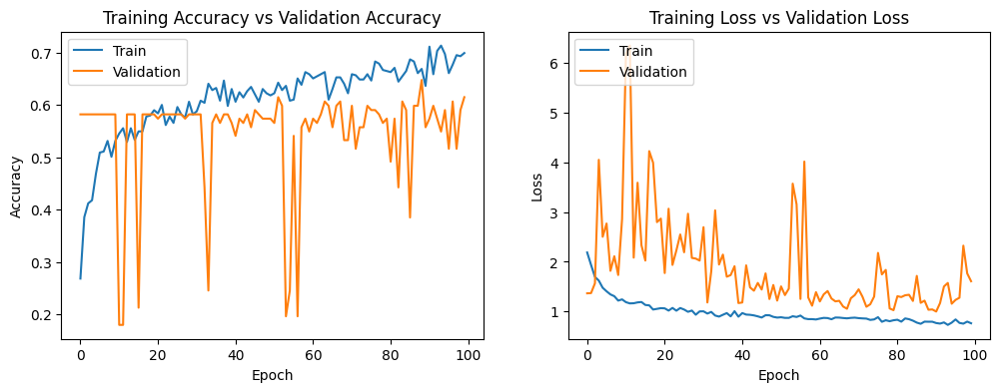

In [ ]:
fig , ax = plt.subplots(1,2)
train_acc = history.history['accuracy']
train_loss = history.history['loss']
fig.set_size_inches(12,4)

ax[0].plot(history.history['accuracy'])
ax[0].plot(history.history['val_accuracy'])
ax[0].set_title('Training Accuracy vs Validation Accuracy')
ax[0].set_ylabel('Accuracy')
ax[0].set_xlabel('Epoch')
ax[0].legend(['Train', 'Validation'], loc='upper left')

ax[1].plot(history.history['loss'])
ax[1].plot(history.history['val_loss'])
ax[1].set_title('Training Loss vs Validation Loss')
ax[1].set_ylabel('Loss')
ax[1].set_xlabel('Epoch')
ax[1].legend(['Train', 'Validation'], loc='upper left')

# **Confusion Matrix**

2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 1s/step


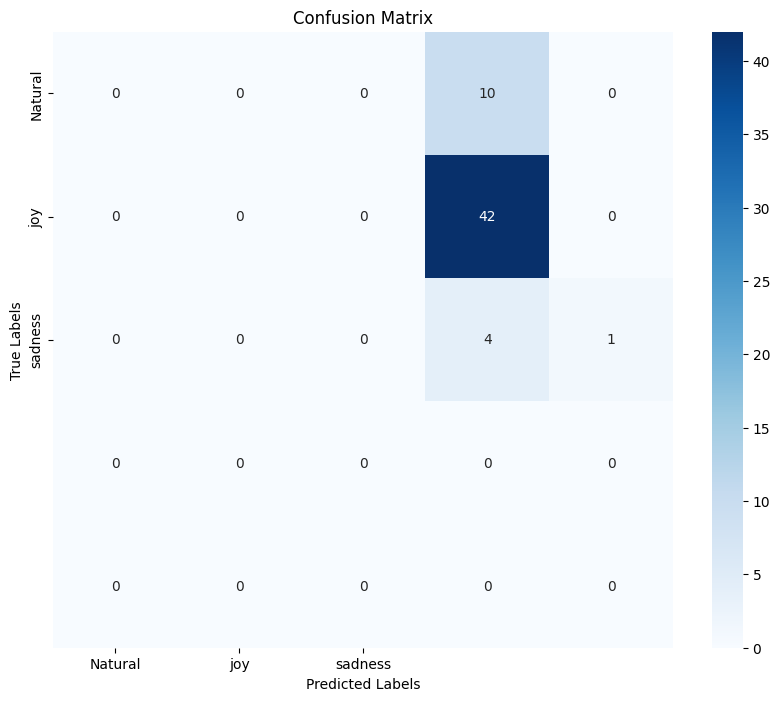


Classification Report:


ValueError: Number of classes, 5, does not match size of target_names, 3. Try specifying the labels parameter

In [ ]:

y_prob = cnn_model2.predict(testgen, verbose=1)
y_pred = np.argmax(y_prob, axis=1)
y_true = testgen.classes
label_map = testgen.class_indices
label_map = {v: k for k, v in label_map.items()}
conf_matrix = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=list(label_map.values()),
            yticklabels=list(label_map.values()))
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()
print("\nClassification Report:")
print(classification_report(y_true, y_pred, target_names=list(label_map.values())))

# **Test Accuracy**

In [ ]:
test_loss, test_acc = cnn_model1.evaluate(testgen)
print(f"Test Accuracy: {test_acc:.2%}")


225/225 ━━━━━━━━━━━━━━━━━━━━ 9s 41ms/step - accuracy: 0.6278 - loss: 1.0660
Test Accuracy: 66.34%


# **Class Wise Accuracy**

In [ ]:

y_prob = cnn_model2.predict(testgen, verbose=1)
y_pred = np.argmax(y_prob, axis=1)
y_true = testgen.classes
label_map = testgen.class_indices
label_map = {v: k for k, v in label_map.items()}
conf_matrix = confusion_matrix(y_true, y_pred)
print("Class-wise Accuracy:\n")
for i, class_name in label_map.items():
    correct = conf_matrix[i][i]
    total = conf_matrix[i].sum()
    acc = correct / total if total > 0 else 0
    print(f"{class_name:<10} : {acc * 100:.2f}%")
print("\nClassification Report:\n")
print(classification_report(y_true, y_pred, target_names=list(label_map.values())))

225/225 ━━━━━━━━━━━━━━━━━━━━ 10s 44ms/step
Class-wise Accuracy:

angry      : 59.19%
disgust    : 54.95%
fear       : 41.11%
happy      : 87.03%
neutral    : 70.88%
sad        : 53.49%
surprise   : 84.36%

Classification Report:

              precision    recall  f1-score   support

       angry       0.61      0.59      0.60       958
     disgust       0.84      0.55      0.66       111
        fear       0.63      0.41      0.50      1024
       happy       0.85      0.87      0.86      1774
     neutral       0.56      0.71      0.63      1233
         sad       0.56      0.53      0.55      1247
    surprise       0.75      0.84      0.79       831

    accuracy                           0.67      7178
   macro avg       0.69      0.64      0.66      7178
weighted avg       0.67      0.67      0.67      7178



225/225 ━━━━━━━━━━━━━━━━━━━━ 9s 41ms/step


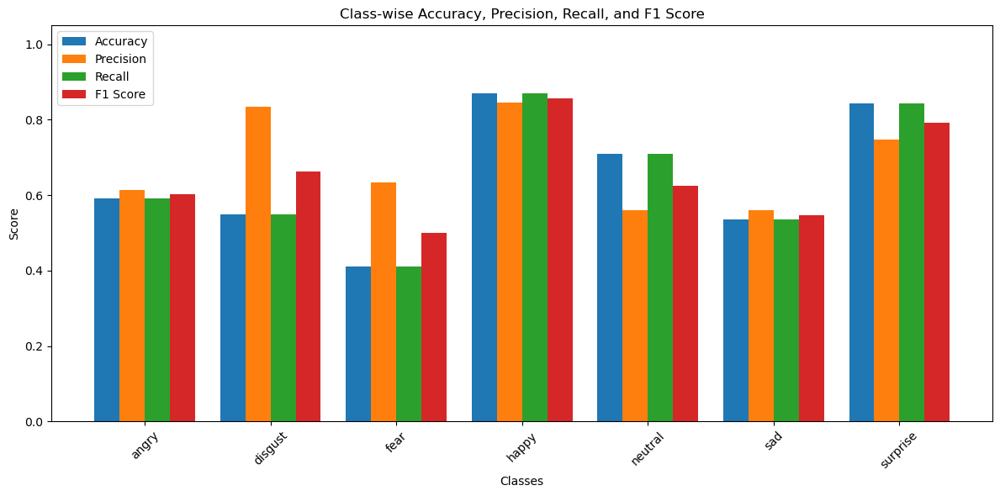


Classification Report:

              precision    recall  f1-score   support

       angry       0.61      0.59      0.60       958
     disgust       0.84      0.55      0.66       111
        fear       0.63      0.41      0.50      1024
       happy       0.85      0.87      0.86      1774
     neutral       0.56      0.71      0.63      1233
         sad       0.56      0.53      0.55      1247
    surprise       0.75      0.84      0.79       831

    accuracy                           0.67      7178
   macro avg       0.69      0.64      0.66      7178
weighted avg       0.67      0.67      0.67      7178



In [ ]:

y_prob = cnn_model2.predict(testgen, verbose=1)
y_pred = np.argmax(y_prob, axis=1)
y_true = testgen.classes

label_map = testgen.class_indices
label_map = {v: k for k, v in label_map.items()}
class_names = [label_map[i] for i in range(len(label_map))]
conf_matrix = confusion_matrix(y_true, y_pred)

class_accuracy = []
for i in range(len(class_names)):
    correct = conf_matrix[i][i]
    total = conf_matrix[i].sum()
    acc = correct / total if total > 0 else 0
    class_accuracy.append(acc)

# Precision, Recall, F1-score
precision = precision_score(y_true, y_pred, average=None, zero_division=0)
recall = recall_score(y_true, y_pred, average=None, zero_division=0)
f1 = f1_score(y_true, y_pred, average=None, zero_division=0)

# Plot
x = np.arange(len(class_names))
width = 0.2

plt.figure(figsize=(12, 6))
plt.bar(x - 1.5*width, class_accuracy, width, label='Accuracy')
plt.bar(x - 0.5*width, precision, width, label='Precision')
plt.bar(x + 0.5*width, recall, width, label='Recall')
plt.bar(x + 1.5*width, f1, width, label='F1 Score')

plt.xticks(x, class_names, rotation=45)
plt.ylim([0, 1.05])
plt.xlabel('Classes')
plt.ylabel('Score')
plt.title('Class-wise Accuracy, Precision, Recall, and F1 Score')
plt.legend()
plt.tight_layout()
plt.show()

# Print classification report
print("\nClassification Report:\n")
print(classification_report(y_true, y_pred, target_names=class_names))


# **CNN With Class Weight and Focal Loss**

In [ ]:
import tensorflow as tf
import keras
from keras.layers import Conv2D, MaxPool2D, Flatten,Dense,Dropout,BatchNormalization
model_cnn= tf.keras.models.Sequential()
model_cnn.add(Conv2D(32, kernel_size=(3, 3), padding='same', activation='relu', input_shape=(48, 48,1)))
model_cnn.add(Conv2D(64,(3,3), padding='same', activation='relu' ))
model_cnn.add(BatchNormalization())
model_cnn.add(MaxPool2D(pool_size=(2, 2)))
model_cnn.add(Dropout(0.25))

model_cnn.add(Conv2D(128,(5,5), padding='same', activation='relu'))
model_cnn.add(BatchNormalization())
model_cnn.add(MaxPool2D(pool_size=(2, 2)))
model_cnn.add(Dropout(0.25))

model_cnn.add(Conv2D(512,(3,3), padding='same', activation='relu'))
model_cnn.add(BatchNormalization())
model_cnn.add(MaxPool2D(pool_size=(2, 2)))
model_cnn.add(Dropout(0.25))
model_cnn.add(Conv2D(512,(3,3), padding='same', activation='relu'))
model_cnn.add(BatchNormalization())
model_cnn.add(MaxPool2D(pool_size=(2, 2)))
model_cnn.add(Dropout(0.25))

model_cnn.add(Flatten())
model_cnn.add(Dense(256,activation = 'relu'))
model_cnn.add(BatchNormalization())
model_cnn.add(Dropout(0.25))

model_cnn.add(Dense(512,activation = 'relu'))
model_cnn.add(BatchNormalization())
model_cnn.add(Dropout(0.25))

model_cnn.add(Dense(7, activation='softmax'))

train_datagen = ImageDataGenerator(width_shift_range = 0.1,
                                         height_shift_range = 0.1,
                                         horizontal_flip = True,
                                         rescale = 1./255,
                                         validation_split = 0.2
                                        )
validation_datagen = ImageDataGenerator(rescale = 1./255,
                                         validation_split = 0.2)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:

for i, layer in enumerate(model_cnn.layers):
    print(f"{i}: {layer.name} ({layer.__class__.__name__})")

0: conv2d_10 (Conv2D)
1: conv2d_11 (Conv2D)
2: batch_normalization_13 (BatchNormalization)
3: max_pooling2d_8 (MaxPooling2D)
4: dropout_12 (Dropout)
5: conv2d_12 (Conv2D)
6: batch_normalization_14 (BatchNormalization)
7: max_pooling2d_9 (MaxPooling2D)
8: dropout_13 (Dropout)
9: conv2d_13 (Conv2D)
10: batch_normalization_15 (BatchNormalization)
11: max_pooling2d_10 (MaxPooling2D)
12: dropout_14 (Dropout)
13: conv2d_14 (Conv2D)
14: batch_normalization_16 (BatchNormalization)
15: max_pooling2d_11 (MaxPooling2D)
16: dropout_15 (Dropout)
17: flatten_1 (Flatten)
18: dense_6 (Dense)
19: batch_normalization_17 (BatchNormalization)
20: dropout_16 (Dropout)
21: dense_7 (Dense)
22: batch_normalization_18 (BatchNormalization)
23: dropout_17 (Dropout)
24: dense_8 (Dense)


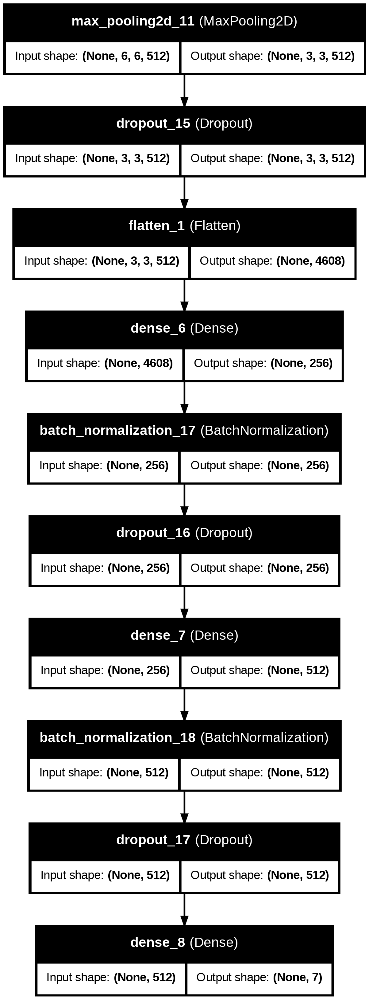

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import plot_model
from IPython.display import Image

def clone_and_rename_layers(layers, start_idx=0):
    new_layers = []
    for i, layer in enumerate(layers):
        new_layer = layer.__class__.from_config(layer.get_config())
        new_layer._name = f"{layer.__class__.__name__.lower()}_{start_idx + i}"
        new_layers.append(new_layer)
    return new_layers

# === PART 1 ===
part1_layers = clone_and_rename_layers(model_cnn.layers[:7], start_idx=0)
part1 = Sequential(name='cnn_part1')
for layer in part1_layers:
    part1.add(layer)
part1.build(input_shape=model_cnn.input_shape)
plot_path1 = '/content/drive/MyDrive/DL Project/convnet3_part1_renamed.png'
plot_model(part1, to_file=plot_path1, show_shapes=True, show_layer_names=True, rankdir='TB')
Image(plot_path1)

# === PART 2 ===
part2_layers = clone_and_rename_layers(model_cnn.layers[7:15], start_idx=7)
part2 = Sequential(name='cnn_part2')
for layer in part2_layers:
    part2.add(layer)
part2.build(input_shape=part1.output_shape)
plot_path2 = '/content/drive/MyDrive/DL Project/convnet3_part2_renamed.png'
plot_model(part2, to_file=plot_path2, show_shapes=True, show_layer_names=True, rankdir='TB')
Image(plot_path2)

# === PART 3 ===
part3_layers = clone_and_rename_layers(model_cnn.layers[15:], start_idx=15)
part3 = Sequential(name='cnn_part3')
for layer in part3_layers:
    part3.add(layer)
part3.build(input_shape=part2.output_shape)
plot_path3 = '/content/drive/MyDrive/DL Project/convnet3_part3_renamed.png'
plot_model(part3, to_file=plot_path3, show_shapes=True, show_layer_names=True, rankdir='TB')
Image(plot_path3)


In [ ]:
model_cnn.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 48, 48, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 48, 48, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 48, 48, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 24, 24, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 24, 24, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 24, 24, 128)    │       204,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 24, 24, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 12, 12, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 12, 12, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 12, 12, 512)    │       590,336 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 12, 12, 512)    │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 6, 6, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 6, 6, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 6, 6, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 6, 6, 512)      │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 3, 3, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 3, 3, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 4608)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 256)            │     1,179,904 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 512)            │       131,584 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 4,496,903 (17.15 MB)

 Trainable params: 4,492,935 (17.14 MB)

 Non-trainable params: 3,968 (15.50 KB)

In [ ]:

img_size=(48,48)
bth_size=32

train_datagen = ImageDataGenerator(
   rescale=1.0/255,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True,  # Try vertical flip as well for more diversity
    validation_split=0.2
)
validation_datagen = ImageDataGenerator(rescale = 1./255,
                                         validation_split = 0.2)

In [ ]:

train_dir = "/content/Dataset/train"
test_dir = "/content/Dataset/test"
from tensorflow.keras.preprocessing.image import ImageDataGenerator

img_size = 48
bth_size = 32

# Train and Validation from the training directory
train_datagen = ImageDataGenerator(
    rescale=1./255,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    validation_split=0.2
)

train_generator = train_datagen.flow_from_directory(
    directory=train_dir,
    target_size=(img_size, img_size),
    batch_size=bth_size,
    color_mode="grayscale",
    class_mode="categorical",
    subset="training",
    shuffle=True
)

validation_generator = train_datagen.flow_from_directory(
    directory=train_dir,
    target_size=(img_size, img_size),
    batch_size=bth_size,
    color_mode="grayscale",
    class_mode="categorical",
    subset="validation",
    shuffle=False
)

# Test Generator (NO subset, no augmentation)
test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(
    directory=test_dir,
    target_size=(img_size, img_size),
    batch_size=bth_size,
    color_mode='grayscale',
    class_mode='categorical',
    shuffle=False
)


Found 22968 images belonging to 7 classes.
Found 5741 images belonging to 7 classes.
Found 7178 images belonging to 7 classes.


In [ ]:
def focal_loss(gamma=2., alpha=0.25):
    def focal_loss_fixed(y_true, y_pred):
        epsilon = 1e-7
        y_pred = tf.clip_by_value(y_pred, epsilon, 1. - epsilon)
        cross_entropy = -y_true * tf.math.log(y_pred)
        weight = alpha * tf.math.pow(1 - y_pred, gamma)
        loss = weight * cross_entropy
        return tf.reduce_sum(loss, axis=1)  # Use tf.reduce_mean if needed
    return focal_loss_fixed

In [ ]:
from sklearn.utils.class_weight import compute_class_weight
import numpy as np

# Get class indices from the training generator
labels = train_generator.classes
class_weights = compute_class_weight(class_weight='balanced', classes=np.unique(labels), y=labels)
class_weights_dict = dict(enumerate(class_weights))


In [ ]:
from tensorflow.keras.optimizers import Adam

model_cnn.compile(
    optimizer=Adam(learning_rate=0.001),
    loss=focal_loss(gamma=2.0, alpha=0.25),
    metrics=['accuracy']
)


In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau

checkpoint_path = "/content/drive/MyDrive/DL Project/cnn_model3_checkpoint.h5"

checkpoint = ModelCheckpoint(
    filepath=checkpoint_path,
    monitor='val_loss',
    save_best_only=True,
    verbose=1,
    mode='min'
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

callbacks = [checkpoint, reduce_lr]


In [ ]:
model_cnn = load_model("/content/cnn_model1_final.h5", compile=False)



In [ ]:
history = model_cnn.fit(
    x=train_generator,
    epochs=100,
    validation_data=validation_generator,
    class_weight=class_weights_dict,
    callbacks=callbacks
)
model_cnn.save("/content/drive/MyDrive/DL Project/cnn_model1_final.h5")


Epoch 1/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - accuracy: 0.1619 - loss: 0.5055
Epoch 1: val_loss improved from inf to 0.38442, saving model to /content/drive/MyDrive/DL Project/cnn_model3_checkpoint.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 50s 50ms/step - accuracy: 0.1619 - loss: 0.5054 - val_accuracy: 0.1251 - val_loss: 0.3844 - learning_rate: 0.0010
Epoch 2/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.1843 - loss: 0.3834
Epoch 2: val_loss improved from 0.38442 to 0.35896, saving model to /content/drive/MyDrive/DL Project/cnn_model3_checkpoint.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - accuracy: 0.1843 - loss: 0.3834 - val_accuracy: 0.1758 - val_loss: 0.3590 - learning_rate: 0.0010
Epoch 3/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 0.1970 - loss: 0.3738
Epoch 3: val_loss did not improve from 0.35896
718/718 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - accuracy: 0.1970 - loss: 0.3738 - val_accuracy: 0.1846 - val_loss: 0.3708 - learning_rate: 0.0010
Epoch 4/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.2344 - loss: 0.3422
Epoch 4: val_loss did not improve from 0.35896
718/718 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - accuracy: 0.2345 - loss: 0.3422 - val_accuracy: 0.1561 - val_loss: 0.3598 - learning_rate: 0.0010
Epoch 5/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.2871 - loss: 0.3194
Epoch 5: val_loss did not improve from 0.35896
718/718 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - accuracy: 0.2871 - loss: 0.3194 - val_accuracy: 0.1825 - val_loss: 0.4276 - learning_rate: 0.0010
Epoch 6/100
718/718 ━━━

718/718 ━━━━━━━━━━━━━━━━━━━━ 28s 39ms/step - accuracy: 0.3173 - loss: 0.3068 - val_accuracy: 0.3517 - val_loss: 0.2882 - learning_rate: 0.0010
Epoch 7/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.3395 - loss: 0.2911
Epoch 7: val_loss did not improve from 0.28817
718/718 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - accuracy: 0.3395 - loss: 0.2911 - val_accuracy: 0.2623 - val_loss: 0.3489 - learning_rate: 0.0010
Epoch 8/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.3303 - loss: 0.2998
Epoch 8: val_loss improved from 0.28817 to 0.26491, saving model to /content/drive/MyDrive/DL Project/cnn_model3_checkpoint.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - accuracy: 0.3303 - loss: 0.2998 - val_accuracy: 0.4043 - val_loss: 0.2649 - learning_rate: 0.0010
Epoch 9/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.3740 - loss: 0.2721
Epoch 9: val_loss improved from 0.26491 to 0.25005, saving model to /content/drive/MyDrive/DL Project/cnn_model3_checkpoint.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - accuracy: 0.3740 - loss: 0.2721 - val_accuracy: 0.4231 - val_loss: 0.2500 - learning_rate: 0.0010
Epoch 10/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.4023 - loss: 0.2565
Epoch 10: val_loss did not improve from 0.25005
718/718 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - accuracy: 0.4023 - loss: 0.2565 - val_accuracy: 0.3155 - val_loss: 0.3337 - learning_rate: 0.0010
Epoch 11/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.4164 - loss: 0.2483
Epoch 11: val_loss did not improve from 0.25005
718/718 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - accuracy: 0.4164 - loss: 0.2483 - val_accuracy: 0.1794 - val_loss: 0.4757 - learning_rate: 0.0010
Epoch 12/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.4355 - loss: 0.2367
Epoch 12: val_loss improved from 0.25005 to 0.22499, saving model to /content/drive/MyDrive/DL Project/cnn_model3_checkpoint.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - accuracy: 0.4355 - loss: 0.2367 - val_accuracy: 0.4727 - val_loss: 0.2250 - learning_rate: 0.0010
Epoch 13/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.4540 - loss: 0.2285
Epoch 13: val_loss improved from 0.22499 to 0.21666, saving model to /content/drive/MyDrive/DL Project/cnn_model3_checkpoint.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - accuracy: 0.4540 - loss: 0.2285 - val_accuracy: 0.4839 - val_loss: 0.2167 - learning_rate: 0.0010
Epoch 14/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.4584 - loss: 0.2175
Epoch 14: val_loss did not improve from 0.21666
718/718 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - accuracy: 0.4584 - loss: 0.2175 - val_accuracy: 0.4551 - val_loss: 0.2265 - learning_rate: 0.0010
Epoch 15/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.4697 - loss: 0.2146
Epoch 15: val_loss improved from 0.21666 to 0.21551, saving model to /content/drive/MyDrive/DL Project/cnn_model3_checkpoint.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - accuracy: 0.4697 - loss: 0.2146 - val_accuracy: 0.4811 - val_loss: 0.2155 - learning_rate: 0.0010
Epoch 16/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.4778 - loss: 0.2088
Epoch 16: val_loss did not improve from 0.21551
718/718 ━━━━━━━━━━━━━━━━━━━━ 37s 35ms/step - accuracy: 0.4778 - loss: 0.2088 - val_accuracy: 0.4297 - val_loss: 0.2375 - learning_rate: 0.0010
Epoch 17/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.4926 - loss: 0.1994
Epoch 17: val_loss improved from 0.21551 to 0.20646, saving model to /content/drive/MyDrive/DL Project/cnn_model3_checkpoint.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 30s 42ms/step - accuracy: 0.4925 - loss: 0.1994 - val_accuracy: 0.4964 - val_loss: 0.2065 - learning_rate: 0.0010
Epoch 18/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.4994 - loss: 0.2026
Epoch 18: val_loss did not improve from 0.20646
718/718 ━━━━━━━━━━━━━━━━━━━━ 36s 35ms/step - accuracy: 0.4994 - loss: 0.2026 - val_accuracy: 0.4658 - val_loss: 0.2250 - learning_rate: 0.0010
Epoch 19/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.5068 - loss: 0.1901
Epoch 19: val_loss did not improve from 0.20646
718/718 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - accuracy: 0.5068 - loss: 0.1901 - val_accuracy: 0.3473 - val_loss: 0.2958 - learning_rate: 0.0010
Epoch 20/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.4920 - loss: 0.2032
Epoch 20: val_loss did not improve from 0.20646
718/718 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - accuracy: 0.4920 - loss: 0.2032 - val_accuracy: 0.4543 - val_loss: 0.2257 - learning_rate: 0.0010
Epoch 21/100
717/

718/718 ━━━━━━━━━━━━━━━━━━━━ 49s 47ms/step - accuracy: 0.5199 - loss: 0.1800 - val_accuracy: 0.5330 - val_loss: 0.1866 - learning_rate: 0.0010
Epoch 23/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.5223 - loss: 0.1794
Epoch 23: val_loss did not improve from 0.18659
718/718 ━━━━━━━━━━━━━━━━━━━━ 33s 36ms/step - accuracy: 0.5223 - loss: 0.1794 - val_accuracy: 0.5309 - val_loss: 0.1891 - learning_rate: 0.0010
Epoch 24/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.5315 - loss: 0.1748
Epoch 24: val_loss did not improve from 0.18659
718/718 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - accuracy: 0.5315 - loss: 0.1748 - val_accuracy: 0.5219 - val_loss: 0.1902 - learning_rate: 0.0010
Epoch 25/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.5336 - loss: 0.1721
Epoch 25: val_loss did not improve from 0.18659
718/718 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - accuracy: 0.5336 - loss: 0.1721 - val_accuracy: 0.4945 - val_loss: 0.2137 - learning_rate: 0.0010
Epoch 26/100
717/

718/718 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - accuracy: 0.5392 - loss: 0.1684 - val_accuracy: 0.5710 - val_loss: 0.1683 - learning_rate: 5.0000e-04
Epoch 29/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.5579 - loss: 0.1606
Epoch 29: val_loss did not improve from 0.16829
718/718 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - accuracy: 0.5580 - loss: 0.1606 - val_accuracy: 0.5595 - val_loss: 0.1754 - learning_rate: 5.0000e-04
Epoch 30/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.5728 - loss: 0.1544
Epoch 30: val_loss did not improve from 0.16829
718/718 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - accuracy: 0.5728 - loss: 0.1544 - val_accuracy: 0.5341 - val_loss: 0.1828 - learning_rate: 5.0000e-04
Epoch 31/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.5731 - loss: 0.1534
Epoch 31: val_loss improved from 0.16829 to 0.16390, saving model to /content/drive/MyDrive/DL Project/cnn_model3_checkpoint.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - accuracy: 0.5731 - loss: 0.1534 - val_accuracy: 0.5804 - val_loss: 0.1639 - learning_rate: 5.0000e-04
Epoch 32/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.5746 - loss: 0.1501
Epoch 32: val_loss did not improve from 0.16390
718/718 ━━━━━━━━━━━━━━━━━━━━ 38s 34ms/step - accuracy: 0.5746 - loss: 0.1501 - val_accuracy: 0.5739 - val_loss: 0.1666 - learning_rate: 5.0000e-04
Epoch 33/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.5785 - loss: 0.1514
Epoch 33: val_loss did not improve from 0.16390
718/718 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - accuracy: 0.5785 - loss: 0.1514 - val_accuracy: 0.5638 - val_loss: 0.1680 - learning_rate: 5.0000e-04
Epoch 34/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.5806 - loss: 0.1468
Epoch 34: val_loss did not improve from 0.16390
718/718 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - accuracy: 0.5806 - loss: 0.1468 - val_accuracy: 0.5776 - val_loss: 0.1656 - learning_rate: 5.0000e-04
E

718/718 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - accuracy: 0.5859 - loss: 0.1427 - val_accuracy: 0.5792 - val_loss: 0.1615 - learning_rate: 5.0000e-04
Epoch 36/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.5834 - loss: 0.1455
Epoch 36: val_loss improved from 0.16148 to 0.15749, saving model to /content/drive/MyDrive/DL Project/cnn_model3_checkpoint.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - accuracy: 0.5834 - loss: 0.1455 - val_accuracy: 0.5975 - val_loss: 0.1575 - learning_rate: 5.0000e-04
Epoch 37/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 0.5841 - loss: 0.1434
Epoch 37: val_loss did not improve from 0.15749
718/718 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - accuracy: 0.5841 - loss: 0.1434 - val_accuracy: 0.5865 - val_loss: 0.1627 - learning_rate: 5.0000e-04
Epoch 38/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.5962 - loss: 0.1425
Epoch 38: val_loss did not improve from 0.15749
718/718 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - accuracy: 0.5962 - loss: 0.1425 - val_accuracy: 0.5595 - val_loss: 0.1730 - learning_rate: 5.0000e-04
Epoch 39/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.5922 - loss: 0.1411
Epoch 39: val_loss did not improve from 0.15749
718/718 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - accuracy: 0.5922 - loss: 0.1411 - val_accuracy: 0.5755 - val_loss: 0.1677 - learning_rate: 5.0000e-04
E

718/718 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - accuracy: 0.5981 - loss: 0.1407 - val_accuracy: 0.5990 - val_loss: 0.1541 - learning_rate: 5.0000e-04
Epoch 42/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.6040 - loss: 0.1389
Epoch 42: val_loss did not improve from 0.15408
718/718 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - accuracy: 0.6040 - loss: 0.1389 - val_accuracy: 0.5825 - val_loss: 0.1624 - learning_rate: 5.0000e-04
Epoch 43/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.6090 - loss: 0.1326
Epoch 43: val_loss did not improve from 0.15408
718/718 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - accuracy: 0.6090 - loss: 0.1326 - val_accuracy: 0.5774 - val_loss: 0.1641 - learning_rate: 5.0000e-04
Epoch 44/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.6056 - loss: 0.1343
Epoch 44: val_loss did not improve from 0.15408
718/718 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - accuracy: 0.6056 - loss: 0.1343 - val_accuracy: 0.5698 - val_loss: 0.1704 - learning_rate: 5.0000e-04
E

718/718 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - accuracy: 0.6275 - loss: 0.1241 - val_accuracy: 0.6070 - val_loss: 0.1536 - learning_rate: 2.5000e-04
Epoch 50/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.6233 - loss: 0.1239
Epoch 50: val_loss did not improve from 0.15361
718/718 ━━━━━━━━━━━━━━━━━━━━ 40s 35ms/step - accuracy: 0.6233 - loss: 0.1239 - val_accuracy: 0.6069 - val_loss: 0.1553 - learning_rate: 2.5000e-04
Epoch 51/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.6253 - loss: 0.1223
Epoch 51: val_loss improved from 0.15361 to 0.15180, saving model to /content/drive/MyDrive/DL Project/cnn_model3_checkpoint.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - accuracy: 0.6253 - loss: 0.1223 - val_accuracy: 0.6102 - val_loss: 0.1518 - learning_rate: 2.5000e-04
Epoch 52/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.6217 - loss: 0.1231
Epoch 52: val_loss did not improve from 0.15180
718/718 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - accuracy: 0.6217 - loss: 0.1231 - val_accuracy: 0.6081 - val_loss: 0.1524 - learning_rate: 2.5000e-04
Epoch 53/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.6293 - loss: 0.1215
Epoch 53: val_loss did not improve from 0.15180
718/718 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - accuracy: 0.6293 - loss: 0.1215 - val_accuracy: 0.6130 - val_loss: 0.1533 - learning_rate: 2.5000e-04
Epoch 54/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.6302 - loss: 0.1210
Epoch 54: val_loss did not improve from 0.15180
718/718 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - accuracy: 0.6302 - loss: 0.1211 - val_accuracy: 0.6062 - val_loss: 0.1545 - learning_rate: 2.5000e-04
E

718/718 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - accuracy: 0.6447 - loss: 0.1159 - val_accuracy: 0.6166 - val_loss: 0.1518 - learning_rate: 1.2500e-04
Epoch 58/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.6441 - loss: 0.1135
Epoch 58: val_loss improved from 0.15175 to 0.15093, saving model to /content/drive/MyDrive/DL Project/cnn_model3_checkpoint.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - accuracy: 0.6441 - loss: 0.1135 - val_accuracy: 0.6154 - val_loss: 0.1509 - learning_rate: 1.2500e-04
Epoch 59/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.6401 - loss: 0.1148
Epoch 59: val_loss did not improve from 0.15093
718/718 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - accuracy: 0.6401 - loss: 0.1148 - val_accuracy: 0.6023 - val_loss: 0.1562 - learning_rate: 1.2500e-04
Epoch 60/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.6383 - loss: 0.1145
Epoch 60: val_loss did not improve from 0.15093
718/718 ━━━━━━━━━━━━━━━━━━━━ 24s 34ms/step - accuracy: 0.6383 - loss: 0.1145 - val_accuracy: 0.6103 - val_loss: 0.1559 - learning_rate: 1.2500e-04
Epoch 61/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.6398 - loss: 0.1163
Epoch 61: val_loss did not improve from 0.15093
718/718 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - accuracy: 0.6398 - loss: 0.1163 - val_accuracy: 0.6184 - val_loss: 0.1513 - learning_rate: 1.2500e-04
E

718/718 ━━━━━━━━━━━━━━━━━━━━ 27s 37ms/step - accuracy: 0.6443 - loss: 0.1131 - val_accuracy: 0.6232 - val_loss: 0.1499 - learning_rate: 6.2500e-05
Epoch 65/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.6496 - loss: 0.1106
Epoch 65: val_loss did not improve from 0.14988
718/718 ━━━━━━━━━━━━━━━━━━━━ 26s 36ms/step - accuracy: 0.6496 - loss: 0.1106 - val_accuracy: 0.6222 - val_loss: 0.1509 - learning_rate: 6.2500e-05
Epoch 66/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.6453 - loss: 0.1150
Epoch 66: val_loss did not improve from 0.14988
718/718 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - accuracy: 0.6453 - loss: 0.1150 - val_accuracy: 0.6147 - val_loss: 0.1528 - learning_rate: 6.2500e-05
Epoch 67/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.6468 - loss: 0.1131
Epoch 67: val_loss did not improve from 0.14988
718/718 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - accuracy: 0.6468 - loss: 0.1131 - val_accuracy: 0.6116 - val_loss: 0.1540 - learning_rate: 6.2500e-05
E

718/718 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - accuracy: 0.6563 - loss: 0.1110 - val_accuracy: 0.6201 - val_loss: 0.1492 - learning_rate: 7.8125e-06
Epoch 81/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.6586 - loss: 0.1087
Epoch 81: val_loss did not improve from 0.14921
718/718 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - accuracy: 0.6586 - loss: 0.1087 - val_accuracy: 0.6257 - val_loss: 0.1524 - learning_rate: 7.8125e-06
Epoch 82/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.6568 - loss: 0.1090
Epoch 82: val_loss did not improve from 0.14921
718/718 ━━━━━━━━━━━━━━━━━━━━ 25s 35ms/step - accuracy: 0.6568 - loss: 0.1090 - val_accuracy: 0.6152 - val_loss: 0.1494 - learning_rate: 7.8125e-06
Epoch 83/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.6463 - loss: 0.1098
Epoch 83: val_loss did not improve from 0.14921
718/718 ━━━━━━━━━━━━━━━━━━━━ 41s 35ms/step - accuracy: 0.6463 - loss: 0.1098 - val_accuracy: 0.6229 - val_loss: 0.1529 - learning_rate: 7.8125e-06
E

718/718 ━━━━━━━━━━━━━━━━━━━━ 43s 37ms/step - accuracy: 0.6598 - loss: 0.1072 - val_accuracy: 0.6220 - val_loss: 0.1480 - learning_rate: 1.0000e-06


# **Plot for Accuracy and Loss**

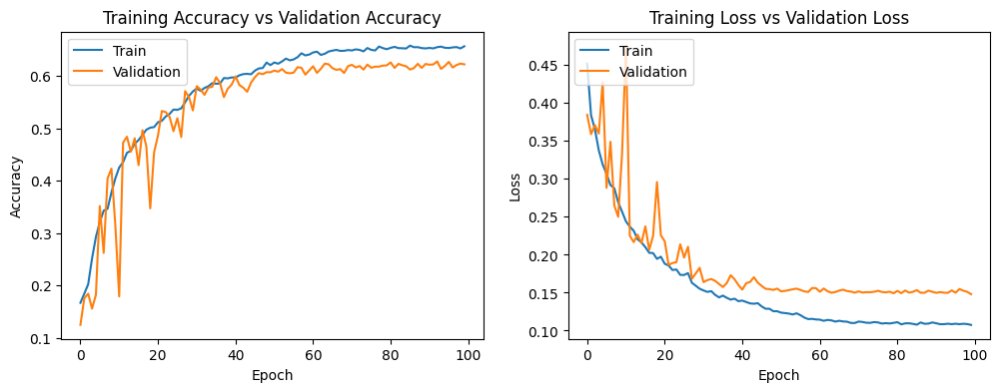

In [ ]:
Lfig , ax = plt.subplots(1,2)
train_acc = history.history['accuracy']
train_loss = history.history['loss']
fig.set_size_inches(12,4)

ax[0].plot(history.history['accuracy'])
ax[0].plot(history.history['val_accuracy'])
ax[0].set_title('Training Accuracy vs Validation Accuracy')
ax[0].set_ylabel('Accuracy')
ax[0].set_xlabel('Epoch')
ax[0].legend(['Train', 'Validation'], loc='upper left')

ax[1].plot(history.history['loss'])
ax[1].plot(history.history['val_loss'])
ax[1].set_title('Training Loss vs Validation Loss')
ax[1].set_ylabel('Loss')
ax[1].set_xlabel('Epoch')
ax[1].legend(['Train', 'Validation'], loc='upper left')

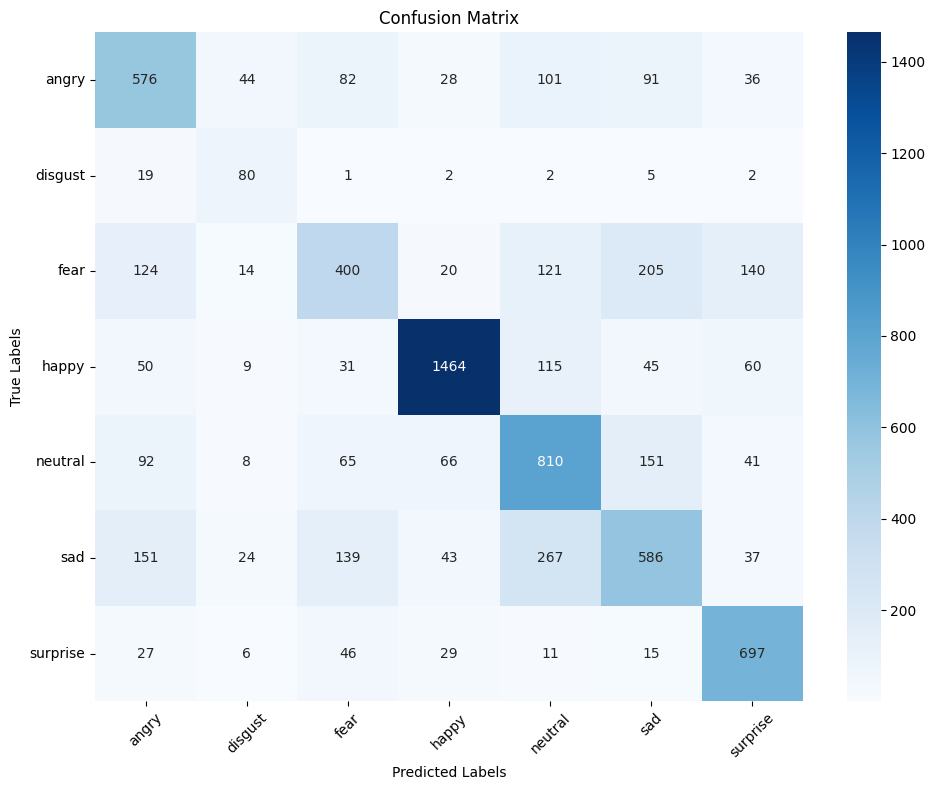

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Compute confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)

# Create a heatmap plot
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=list(label_map.values()),
            yticklabels=list(label_map.values()))

plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


# **Class Wise Accuracy**

In [ ]:

y_prob = model_cnn.predict(testgen, verbose=1)
y_pred = np.argmax(y_prob, axis=1)
y_true = testgen.classes
label_map = testgen.class_indices
label_map = {v: k for k, v in label_map.items()}
conf_matrix = confusion_matrix(y_true, y_pred)
print("Class-wise Accuracy:\n")
for i, class_name in label_map.items():
    correct = conf_matrix[i][i]
    total = conf_matrix[i].sum()
    acc = correct / total if total > 0 else 0
    print(f"{class_name:<10} : {acc * 100:.2f}%")
print("\nClassification Report:\n")
print(classification_report(y_true, y_pred, target_names=list(label_map.values())))

225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step
Class-wise Accuracy:

angry      : 60.13%
disgust    : 72.07%
fear       : 39.06%
happy      : 82.53%
neutral    : 65.69%
sad        : 46.99%
surprise   : 83.87%

Classification Report:

              precision    recall  f1-score   support

       angry       0.55      0.60      0.58       958
     disgust       0.43      0.72      0.54       111
        fear       0.52      0.39      0.45      1024
       happy       0.89      0.83      0.85      1774
     neutral       0.57      0.66      0.61      1233
         sad       0.53      0.47      0.50      1247
    surprise       0.69      0.84      0.76       831

    accuracy                           0.64      7178
   macro avg       0.60      0.64      0.61      7178
weighted avg       0.64      0.64      0.64      7178



# **Plot for Performance Metrics**

225/225 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step


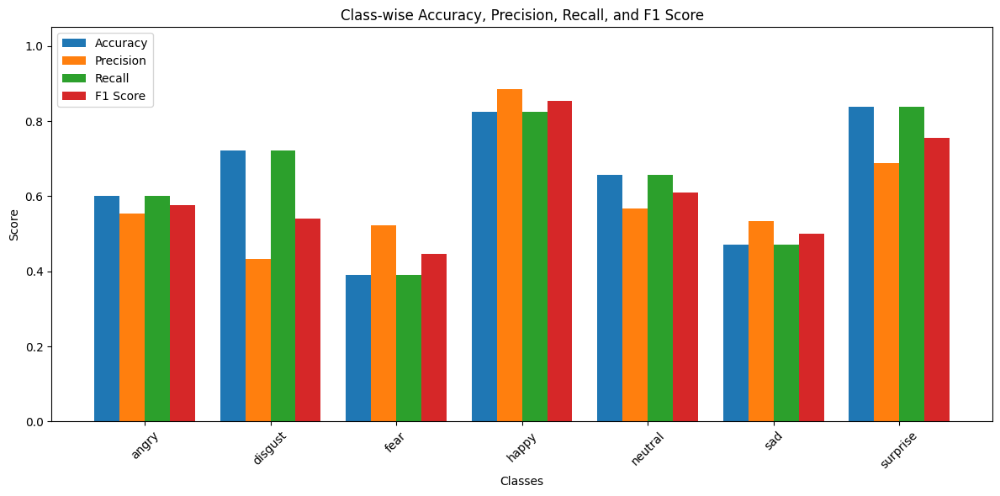


Classification Report:

              precision    recall  f1-score   support

       angry       0.55      0.60      0.58       958
     disgust       0.43      0.72      0.54       111
        fear       0.52      0.39      0.45      1024
       happy       0.89      0.83      0.85      1774
     neutral       0.57      0.66      0.61      1233
         sad       0.53      0.47      0.50      1247
    surprise       0.69      0.84      0.76       831

    accuracy                           0.64      7178
   macro avg       0.60      0.64      0.61      7178
weighted avg       0.64      0.64      0.64      7178



In [ ]:

y_prob = model_cnn.predict(testgen, verbose=1)
y_pred = np.argmax(y_prob, axis=1)
y_true = testgen.classes

label_map = testgen.class_indices
label_map = {v: k for k, v in label_map.items()}
class_names = [label_map[i] for i in range(len(label_map))]
conf_matrix = confusion_matrix(y_true, y_pred)

class_accuracy = []
for i in range(len(class_names)):
    correct = conf_matrix[i][i]
    total = conf_matrix[i].sum()
    acc = correct / total if total > 0 else 0
    class_accuracy.append(acc)

# Precision, Recall, F1-score
precision = precision_score(y_true, y_pred, average=None, zero_division=0)
recall = recall_score(y_true, y_pred, average=None, zero_division=0)
f1 = f1_score(y_true, y_pred, average=None, zero_division=0)

# Plot
x = np.arange(len(class_names))
width = 0.2

plt.figure(figsize=(12, 6))
plt.bar(x - 1.5*width, class_accuracy, width, label='Accuracy')
plt.bar(x - 0.5*width, precision, width, label='Precision')
plt.bar(x + 0.5*width, recall, width, label='Recall')
plt.bar(x + 1.5*width, f1, width, label='F1 Score')

plt.xticks(x, class_names, rotation=45)
plt.ylim([0, 1.05])
plt.xlabel('Classes')
plt.ylabel('Score')
plt.title('Class-wise Accuracy, Precision, Recall, and F1 Score')
plt.legend()
plt.tight_layout()
plt.show()

# Print classification report
print("\nClassification Report:\n")
print(classification_report(y_true, y_pred, target_names=class_names))


# **Custom CNN with L2 Regulaization**

In [ ]:

cnnModel = Sequential()

# Block 1
cnnModel.add(Conv2D(32, (3, 3), padding='same', kernel_regularizer=l2(0.001), input_shape=(48, 48, 1)))
cnnModel.add(BatchNormalization())
cnnModel.add(LeakyReLU(alpha=0.1))
cnnModel.add(Conv2D(64, (3, 3), padding='same', kernel_regularizer=l2(0.001)))
cnnModel.add(BatchNormalization())
cnnModel.add(LeakyReLU(alpha=0.1))
cnnModel.add(MaxPool2D(pool_size=(2, 2)))
cnnModel.add(Dropout(0.25))

# Block 2
cnnModel.add(Conv2D(128, (5, 5), padding='same', kernel_regularizer=l2(0.001)))
cnnModel.add(BatchNormalization())
cnnModel.add(LeakyReLU(alpha=0.1))
cnnModel.add(MaxPool2D(pool_size=(2, 2)))
cnnModel.add(Dropout(0.3))

# Block 3
cnnModel.add(Conv2D(512, (3, 3), padding='same', kernel_regularizer=l2(0.001)))
cnnModel.add(BatchNormalization())
cnnModel.add(LeakyReLU(alpha=0.1))
cnnModel.add(MaxPool2D(pool_size=(2, 2)))
cnnModel.add(Dropout(0.4))
# Block 4
cnnModel.add(Conv2D(1024, (3, 3), padding='same', kernel_regularizer=l2(0.001)))
cnnModel.add(BatchNormalization())
cnnModel.add(LeakyReLU(alpha=0.1))
cnnModel.add(MaxPool2D(pool_size=(2, 2)))
cnnModel.add(Dropout(0.4))

# Classification Head
cnnModel.add(GlobalAveragePooling2D())

cnnModel.add(Dense(256, kernel_regularizer=l2(0.001)))
cnnModel.add(BatchNormalization())
cnnModel.add(LeakyReLU(alpha=0.1))
cnnModel.add(Dropout(0.5))

cnnModel.add(Dense(128, kernel_regularizer=l2(0.001)))
cnnModel.add(BatchNormalization())
cnnModel.add(LeakyReLU(alpha=0.1))
cnnModel.add(Dropout(0.4))

cnnModel.add(Dense(7, activation='softmax'))  # Output layer for FER-2013 (7 classes)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


In [ ]:
for i, layer in enumerate(cnnModel.layers):
    print(f"{i}: {layer.name} ({layer.__class__.__name__})")


0: conv2d (Conv2D)
1: batch_normalization (BatchNormalization)
2: leaky_re_lu (LeakyReLU)
3: conv2d_1 (Conv2D)
4: batch_normalization_1 (BatchNormalization)
5: leaky_re_lu_1 (LeakyReLU)
6: max_pooling2d (MaxPooling2D)
7: dropout (Dropout)
8: conv2d_2 (Conv2D)
9: batch_normalization_2 (BatchNormalization)
10: leaky_re_lu_2 (LeakyReLU)
11: max_pooling2d_1 (MaxPooling2D)
12: dropout_1 (Dropout)
13: conv2d_3 (Conv2D)
14: batch_normalization_3 (BatchNormalization)
15: leaky_re_lu_3 (LeakyReLU)
16: max_pooling2d_2 (MaxPooling2D)
17: dropout_2 (Dropout)
18: conv2d_4 (Conv2D)
19: batch_normalization_4 (BatchNormalization)
20: leaky_re_lu_4 (LeakyReLU)
21: max_pooling2d_3 (MaxPooling2D)
22: dropout_3 (Dropout)
23: global_average_pooling2d (GlobalAveragePooling2D)
24: dense (Dense)
25: batch_normalization_5 (BatchNormalization)
26: leaky_re_lu_5 (LeakyReLU)
27: dropout_4 (Dropout)
28: dense_1 (Dense)
29: batch_normalization_6 (BatchNormalization)
30: leaky_re_lu_6 (LeakyReLU)
31: dropout_5 (Drop

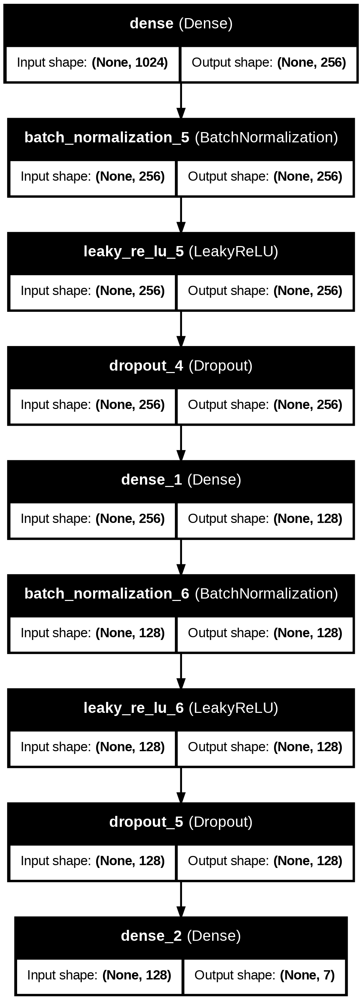

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import plot_model
from IPython.display import Image

def clone_and_rename_layers(layers, start_idx=0):
    new_layers = []
    for i, layer in enumerate(layers):
        new_layer = layer.__class__.from_config(layer.get_config())
        new_layer._name = f"{layer.__class__.__name__.lower()}_{start_idx + i}"
        new_layers.append(new_layer)
    return new_layers

# === PART 1 ===
part1_layers = clone_and_rename_layers(cnnModel.layers[:8], start_idx=0)
part1 = Sequential(name='cnn_part1')
for layer in part1_layers:
    part1.add(layer)
part1.build(input_shape=cnnModel.input_shape)
plot_path1 = '/content/drive/MyDrive/DL Project/convnet_part1.png'
plot_model(part1, to_file=plot_path1, show_shapes=True, show_layer_names=True, rankdir='TB')
Image(plot_path1)

# === PART 2 ===
part2_layers = clone_and_rename_layers(cnnModel.layers[8:16], start_idx=8)
part2 = Sequential(name='cnn_part2')
for layer in part2_layers:
    part2.add(layer)
part2.build(input_shape=part1.output_shape)
plot_path2 = '/content/drive/MyDrive/DL Project/convnet_part2.png'
plot_model(part2, to_file=plot_path2, show_shapes=True, show_layer_names=True, rankdir='TB')
Image(plot_path2)

# === PART 3 ===
part3_layers = clone_and_rename_layers(cnnModel.layers[16:24], start_idx=16)
part3 = Sequential(name='cnn_part3')
for layer in part3_layers:
    part3.add(layer)
part3.build(input_shape=part2.output_shape)
plot_path3 = '/content/drive/MyDrive/DL Project/convnet_part3.png'
plot_model(part3, to_file=plot_path3, show_shapes=True, show_layer_names=True, rankdir='TB')
Image(plot_path3)

# === PART 4 ===
part4_layers = clone_and_rename_layers(cnnModel.layers[24:], start_idx=24)
part4 = Sequential(name='cnn_part4')
for layer in part4_layers:
    part4.add(layer)
part4.build(input_shape=part3.output_shape)
plot_path4 = '/content/drive/MyDrive/DL Project/convnet_part4.png'
plot_model(part4, to_file=plot_path4, show_shapes=True, show_layer_names=True, rankdir='TB')
Image(plot_path4)


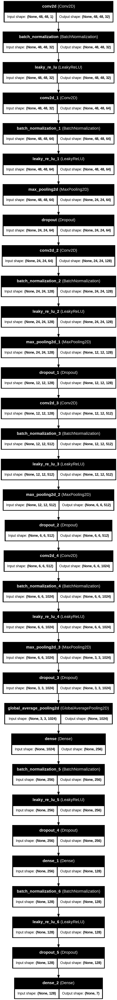

In [ ]:
from tensorflow.keras.utils import plot_model
from IPython.display import Image

# Define full path in Google Drive
drive_path = '/content/drive/MyDrive/DL Project/convnet3.png'

# Save the plot
plot_model(cnnModel, to_file=drive_path, show_shapes=True, show_layer_names=True)

# Display the saved image
Image(filename=drive_path)


In [ ]:
cnnModel.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_1 (Conv2D)               │ (None, 48, 48, 32)     │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 48, 48, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 48, 48, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 48, 48, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 48, 48, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 48, 48, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 24, 24, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 24, 24, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 24, 24, 128)    │       204,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 24, 24, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 24, 24, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 12, 12, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 12, 12, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 12, 12, 512)    │       590,336 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 12, 12, 512)    │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_3 (LeakyReLU)       │ (None, 12, 12, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 6, 6, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 6, 6, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 6, 6, 1024)     │     4,719,616 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 6, 6, 1024)     │         4,096 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_4 (LeakyReLU)       │ (None, 6, 6, 1024)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 3, 3, 1024)     │             0 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 5,838,471 (22.27 MB)

 Trainable params: 5,834,183 (22.26 MB)

 Non-trainable params: 4,288 (16.75 KB)

In [ ]:
bth_size = 32

# Augmentation for training
train_datagen = ImageDataGenerator(
    rescale=1./255,
    width_shift_range=0.1,
    height_shift_range=0.1,
    rotation_range=15,
    zoom_range=0.1,
    shear_range=0.1,
    horizontal_flip=True,
    validation_split=0.2
)

# Train generator
train_generator = train_datagen.flow_from_directory(
    directory=train_dir,
    target_size=img_size,
    batch_size=bth_size,
    color_mode="grayscale",
    class_mode="categorical",
    subset="training",
    shuffle=True
)

# Validation generator
validation_generator = train_datagen.flow_from_directory(
    directory=train_dir,
    target_size=img_size,
    batch_size=bth_size,
    color_mode="grayscale",
    class_mode="categorical",
    subset="validation",
    shuffle=False
)

# Test generator (no augmentation)
test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(
    directory=test_dir,
    target_size=img_size,
    batch_size=bth_size,
    color_mode='grayscale',
    class_mode='categorical',
    shuffle=False
)

Found 22968 images belonging to 7 classes.
Found 5741 images belonging to 7 classes.
Found 7178 images belonging to 7 classes.


In [ ]:
def focal_loss(gamma=2., alpha=0.25):
    def focal_loss_fixed(y_true, y_pred):
        epsilon = 1e-7
        y_pred = tf.clip_by_value(y_pred, epsilon, 1. - epsilon)
        cross_entropy = -y_true * tf.math.log(y_pred)
        weight = alpha * tf.math.pow(1 - y_pred, gamma)
        loss = weight * cross_entropy
        return tf.reduce_mean(tf.reduce_sum(loss, axis=1))  # scalar loss
    return focal_loss_fixed


In [ ]:

labels = train_generator.classes
class_weights = compute_class_weight(class_weight='balanced', classes=np.unique(labels), y=labels)
class_weights_dict = dict(enumerate(class_weights))


In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping

checkpoint_path = "/content/drive/MyDrive/DL Project/cnn_model4_checkpoint.h5"

checkpoint = ModelCheckpoint(
    filepath=checkpoint_path,
    monitor='val_loss',
    save_best_only=True,
    verbose=1,
    mode='min'
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

early_stop = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True,
    verbose=1
)

callbacks = [checkpoint, reduce_lr, early_stop]


In [ ]:


cnnModel.compile(
    optimizer=Adam(learning_rate=0.001),
    loss=focal_loss(gamma=2.0, alpha=0.25),
    metrics=['accuracy']
)

In [ ]:
import h5py

with h5py.File("/content/drive/MyDrive/DL Project/cnn_model_finalvs.h5", 'r') as f:
    print("Keys in the model file:", list(f.keys()))
    print("Model attributes:", list(f.attrs))


Keys in the model file: ['model_weights', 'optimizer_weights']
Model attributes: ['backend', 'keras_version', 'model_config', 'training_config']


In [ ]:
history = cnnModel.fit(
    x=train_generator,
    epochs=100,
    validation_data=validation_generator,
    class_weight=class_weights_dict,
    callbacks=callbacks
)
cnnModel.save("/content/drive/MyDrive/DL Project/cnn_model_finalvs.h5")

Epoch 1/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - accuracy: 0.2015 - loss: 1.3987
Epoch 1: val_loss improved from inf to 0.44236, saving model to /content/drive/MyDrive/DL Project/cnn_model4_checkpoint.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step - accuracy: 0.2015 - loss: 1.3980 - val_accuracy: 0.2566 - val_loss: 0.4424 - learning_rate: 0.0010
Epoch 2/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 0.2351 - loss: 0.4315
Epoch 2: val_loss improved from 0.44236 to 0.43811, saving model to /content/drive/MyDrive/DL Project/cnn_model4_checkpoint.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - accuracy: 0.2352 - loss: 0.4314 - val_accuracy: 0.2446 - val_loss: 0.4381 - learning_rate: 0.0010
Epoch 3/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.2629 - loss: 0.3964
Epoch 3: val_loss improved from 0.43811 to 0.40504, saving model to /content/drive/MyDrive/DL Project/cnn_model4_checkpoint.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 30s 42ms/step - accuracy: 0.2629 - loss: 0.3964 - val_accuracy: 0.1991 - val_loss: 0.4050 - learning_rate: 0.0010
Epoch 4/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.2840 - loss: 0.3806
Epoch 4: val_loss did not improve from 0.40504
718/718 ━━━━━━━━━━━━━━━━━━━━ 40s 40ms/step - accuracy: 0.2840 - loss: 0.3806 - val_accuracy: 0.1512 - val_loss: 0.5689 - learning_rate: 0.0010
Epoch 5/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.2996 - loss: 0.3884
Epoch 5: val_loss did not improve from 0.40504
718/718 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - accuracy: 0.2996 - loss: 0.3884 - val_accuracy: 0.1806 - val_loss: 0.4405 - learning_rate: 0.0010
Epoch 6/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.3231 - loss: 0.3914
Epoch 6: val_loss did not improve from 0.40504
718/718 ━━━━━━━━━━━━━━━━━━━━ 28s 39ms/step - accuracy: 0.3231 - loss: 0.3914 - val_accuracy: 0.1630 - val_loss: 0.4740 - learning_rate: 0.0010
Epoch 7/100
717/718 ━━━

718/718 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - accuracy: 0.3493 - loss: 0.3925 - val_accuracy: 0.3195 - val_loss: 0.3897 - learning_rate: 0.0010
Epoch 9/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.3602 - loss: 0.4005
Epoch 9: val_loss did not improve from 0.38971
718/718 ━━━━━━━━━━━━━━━━━━━━ 40s 38ms/step - accuracy: 0.3602 - loss: 0.4005 - val_accuracy: 0.1287 - val_loss: 0.7990 - learning_rate: 0.0010
Epoch 10/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.3654 - loss: 0.4029
Epoch 10: val_loss did not improve from 0.38971
718/718 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - accuracy: 0.3654 - loss: 0.4029 - val_accuracy: 0.2834 - val_loss: 0.4612 - learning_rate: 0.0010
Epoch 11/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.3797 - loss: 0.4011
Epoch 11: val_loss did not improve from 0.38971
718/718 ━━━━━━━━━━━━━━━━━━━━ 28s 39ms/step - accuracy: 0.3797 - loss: 0.4011 - val_accuracy: 0.2794 - val_loss: 0.4660 - learning_rate: 0.0010
Epoch 12/100
717/71

718/718 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - accuracy: 0.4304 - loss: 0.3478 - val_accuracy: 0.4243 - val_loss: 0.3376 - learning_rate: 5.0000e-04
Epoch 15/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.4424 - loss: 0.3291
Epoch 15: val_loss did not improve from 0.33760
718/718 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - accuracy: 0.4424 - loss: 0.3291 - val_accuracy: 0.3778 - val_loss: 0.3603 - learning_rate: 5.0000e-04
Epoch 16/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 0.4527 - loss: 0.3317
Epoch 16: val_loss did not improve from 0.33760
718/718 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - accuracy: 0.4527 - loss: 0.3317 - val_accuracy: 0.4126 - val_loss: 0.3385 - learning_rate: 5.0000e-04
Epoch 17/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 0.4580 - loss: 0.3289
Epoch 17: val_loss improved from 0.33760 to 0.32166, saving model to /content/drive/MyDrive/DL Project/cnn_model4_checkpoint.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 42s 40ms/step - accuracy: 0.4580 - loss: 0.3289 - val_accuracy: 0.4679 - val_loss: 0.3217 - learning_rate: 5.0000e-04
Epoch 18/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.4618 - loss: 0.3262
Epoch 18: val_loss did not improve from 0.32166
718/718 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - accuracy: 0.4618 - loss: 0.3262 - val_accuracy: 0.4119 - val_loss: 0.3262 - learning_rate: 5.0000e-04
Epoch 19/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.4603 - loss: 0.3279
Epoch 19: val_loss did not improve from 0.32166
718/718 ━━━━━━━━━━━━━━━━━━━━ 28s 39ms/step - accuracy: 0.4603 - loss: 0.3279 - val_accuracy: 0.4168 - val_loss: 0.3335 - learning_rate: 5.0000e-04
Epoch 20/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.4652 - loss: 0.3242
Epoch 20: val_loss did not improve from 0.32166
718/718 ━━━━━━━━━━━━━━━━━━━━ 28s 38ms/step - accuracy: 0.4652 - loss: 0.3242 - val_accuracy: 0.3973 - val_loss: 0.3443 - learning_rate: 5.0000e-04
E

718/718 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - accuracy: 0.4840 - loss: 0.2973 - val_accuracy: 0.4480 - val_loss: 0.2915 - learning_rate: 2.5000e-04
Epoch 24/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.5019 - loss: 0.2754
Epoch 24: val_loss improved from 0.29149 to 0.28677, saving model to /content/drive/MyDrive/DL Project/cnn_model4_checkpoint.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - accuracy: 0.5019 - loss: 0.2754 - val_accuracy: 0.4809 - val_loss: 0.2868 - learning_rate: 2.5000e-04
Epoch 25/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.5008 - loss: 0.2779
Epoch 25: val_loss improved from 0.28677 to 0.26352, saving model to /content/drive/MyDrive/DL Project/cnn_model4_checkpoint.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - accuracy: 0.5008 - loss: 0.2778 - val_accuracy: 0.5114 - val_loss: 0.2635 - learning_rate: 2.5000e-04
Epoch 26/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.5096 - loss: 0.2714
Epoch 26: val_loss did not improve from 0.26352
718/718 ━━━━━━━━━━━━━━━━━━━━ 41s 40ms/step - accuracy: 0.5096 - loss: 0.2714 - val_accuracy: 0.4907 - val_loss: 0.2824 - learning_rate: 2.5000e-04
Epoch 27/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 0.5090 - loss: 0.2694
Epoch 27: val_loss did not improve from 0.26352
718/718 ━━━━━━━━━━━━━━━━━━━━ 40s 38ms/step - accuracy: 0.5090 - loss: 0.2694 - val_accuracy: 0.4872 - val_loss: 0.2744 - learning_rate: 2.5000e-04
Epoch 28/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 0.5058 - loss: 0.2719
Epoch 28: val_loss did not improve from 0.26352
718/718 ━━━━━━━━━━━━━━━━━━━━ 28s 39ms/step - accuracy: 0.5058 - loss: 0.2719 - val_accuracy: 0.4632 - val_loss: 0.2900 - learning_rate: 2.5000e-04
E

718/718 ━━━━━━━━━━━━━━━━━━━━ 30s 42ms/step - accuracy: 0.5107 - loss: 0.2702 - val_accuracy: 0.5295 - val_loss: 0.2582 - learning_rate: 2.5000e-04
Epoch 31/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.5128 - loss: 0.2680
Epoch 31: val_loss did not improve from 0.25824
718/718 ━━━━━━━━━━━━━━━━━━━━ 29s 41ms/step - accuracy: 0.5128 - loss: 0.2680 - val_accuracy: 0.5003 - val_loss: 0.2675 - learning_rate: 2.5000e-04
Epoch 32/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.5156 - loss: 0.2631
Epoch 32: val_loss improved from 0.25824 to 0.25388, saving model to /content/drive/MyDrive/DL Project/cnn_model4_checkpoint.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 41s 41ms/step - accuracy: 0.5156 - loss: 0.2632 - val_accuracy: 0.5396 - val_loss: 0.2539 - learning_rate: 2.5000e-04
Epoch 33/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.5176 - loss: 0.2618
Epoch 33: val_loss did not improve from 0.25388
718/718 ━━━━━━━━━━━━━━━━━━━━ 30s 41ms/step - accuracy: 0.5176 - loss: 0.2618 - val_accuracy: 0.5276 - val_loss: 0.2543 - learning_rate: 2.5000e-04
Epoch 34/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.5159 - loss: 0.2622
Epoch 34: val_loss did not improve from 0.25388
718/718 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - accuracy: 0.5159 - loss: 0.2622 - val_accuracy: 0.5294 - val_loss: 0.2540 - learning_rate: 2.5000e-04
Epoch 35/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.5231 - loss: 0.2644
Epoch 35: val_loss did not improve from 0.25388
718/718 ━━━━━━━━━━━━━━━━━━━━ 28s 39ms/step - accuracy: 0.5231 - loss: 0.2644 - val_accuracy: 0.4438 - val_loss: 0.2958 - learning_rate: 2.5000e-04
E

718/718 ━━━━━━━━━━━━━━━━━━━━ 30s 41ms/step - accuracy: 0.5249 - loss: 0.2589 - val_accuracy: 0.5572 - val_loss: 0.2274 - learning_rate: 1.2500e-04
Epoch 39/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.5415 - loss: 0.2420
Epoch 39: val_loss improved from 0.22741 to 0.22577, saving model to /content/drive/MyDrive/DL Project/cnn_model4_checkpoint.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 42s 42ms/step - accuracy: 0.5415 - loss: 0.2420 - val_accuracy: 0.5537 - val_loss: 0.2258 - learning_rate: 1.2500e-04
Epoch 40/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.5423 - loss: 0.2374
Epoch 40: val_loss improved from 0.22577 to 0.22169, saving model to /content/drive/MyDrive/DL Project/cnn_model4_checkpoint.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 30s 42ms/step - accuracy: 0.5423 - loss: 0.2374 - val_accuracy: 0.5626 - val_loss: 0.2217 - learning_rate: 1.2500e-04
Epoch 41/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.5441 - loss: 0.2305
Epoch 41: val_loss improved from 0.22169 to 0.22046, saving model to /content/drive/MyDrive/DL Project/cnn_model4_checkpoint.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step - accuracy: 0.5441 - loss: 0.2305 - val_accuracy: 0.5696 - val_loss: 0.2205 - learning_rate: 1.2500e-04
Epoch 42/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.5464 - loss: 0.2335
Epoch 42: val_loss did not improve from 0.22046
718/718 ━━━━━━━━━━━━━━━━━━━━ 35s 41ms/step - accuracy: 0.5464 - loss: 0.2335 - val_accuracy: 0.5600 - val_loss: 0.2234 - learning_rate: 1.2500e-04
Epoch 43/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.5542 - loss: 0.2279
Epoch 43: val_loss improved from 0.22046 to 0.22038, saving model to /content/drive/MyDrive/DL Project/cnn_model4_checkpoint.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 29s 41ms/step - accuracy: 0.5542 - loss: 0.2279 - val_accuracy: 0.5712 - val_loss: 0.2204 - learning_rate: 1.2500e-04
Epoch 44/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.5435 - loss: 0.2309
Epoch 44: val_loss did not improve from 0.22038
718/718 ━━━━━━━━━━━━━━━━━━━━ 30s 41ms/step - accuracy: 0.5435 - loss: 0.2309 - val_accuracy: 0.5417 - val_loss: 0.2290 - learning_rate: 1.2500e-04
Epoch 45/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.5470 - loss: 0.2256
Epoch 45: val_loss did not improve from 0.22038
718/718 ━━━━━━━━━━━━━━━━━━━━ 29s 41ms/step - accuracy: 0.5470 - loss: 0.2256 - val_accuracy: 0.5616 - val_loss: 0.2224 - learning_rate: 1.2500e-04
Epoch 46/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.5480 - loss: 0.2279
Epoch 46: val_loss improved from 0.22038 to 0.21559, saving model to /content/drive/MyDrive/DL Project/cnn_model4_checkpoint.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 30s 42ms/step - accuracy: 0.5480 - loss: 0.2279 - val_accuracy: 0.5658 - val_loss: 0.2156 - learning_rate: 1.2500e-04
Epoch 47/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - accuracy: 0.5475 - loss: 0.2304
Epoch 47: val_loss did not improve from 0.21559
718/718 ━━━━━━━━━━━━━━━━━━━━ 41s 42ms/step - accuracy: 0.5475 - loss: 0.2304 - val_accuracy: 0.5743 - val_loss: 0.2172 - learning_rate: 1.2500e-04
Epoch 48/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.5489 - loss: 0.2283
Epoch 48: val_loss improved from 0.21559 to 0.21439, saving model to /content/drive/MyDrive/DL Project/cnn_model4_checkpoint.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 35s 48ms/step - accuracy: 0.5489 - loss: 0.2283 - val_accuracy: 0.5673 - val_loss: 0.2144 - learning_rate: 1.2500e-04
Epoch 49/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.5556 - loss: 0.2276
Epoch 49: val_loss did not improve from 0.21439
718/718 ━━━━━━━━━━━━━━━━━━━━ 30s 41ms/step - accuracy: 0.5556 - loss: 0.2276 - val_accuracy: 0.5671 - val_loss: 0.2147 - learning_rate: 1.2500e-04
Epoch 50/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.5487 - loss: 0.2295
Epoch 50: val_loss did not improve from 0.21439
718/718 ━━━━━━━━━━━━━━━━━━━━ 28s 39ms/step - accuracy: 0.5487 - loss: 0.2295 - val_accuracy: 0.5668 - val_loss: 0.2197 - learning_rate: 1.2500e-04
Epoch 51/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.5499 - loss: 0.2290
Epoch 51: val_loss did not improve from 0.21439
718/718 ━━━━━━━━━━━━━━━━━━━━ 28s 39ms/step - accuracy: 0.5499 - loss: 0.2290 - val_accuracy: 0.5267 - val_loss: 0.2474 - learning_rate: 1.2500e-04
E

718/718 ━━━━━━━━━━━━━━━━━━━━ 30s 42ms/step - accuracy: 0.5661 - loss: 0.2203 - val_accuracy: 0.5828 - val_loss: 0.2022 - learning_rate: 6.2500e-05
Epoch 55/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.5667 - loss: 0.2126
Epoch 55: val_loss improved from 0.20223 to 0.20104, saving model to /content/drive/MyDrive/DL Project/cnn_model4_checkpoint.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 42s 44ms/step - accuracy: 0.5667 - loss: 0.2126 - val_accuracy: 0.5877 - val_loss: 0.2010 - learning_rate: 6.2500e-05
Epoch 56/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.5727 - loss: 0.2111
Epoch 56: val_loss improved from 0.20104 to 0.19542, saving model to /content/drive/MyDrive/DL Project/cnn_model4_checkpoint.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 31s 43ms/step - accuracy: 0.5726 - loss: 0.2111 - val_accuracy: 0.5860 - val_loss: 0.1954 - learning_rate: 6.2500e-05
Epoch 57/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.5733 - loss: 0.2094
Epoch 57: val_loss did not improve from 0.19542
718/718 ━━━━━━━━━━━━━━━━━━━━ 40s 41ms/step - accuracy: 0.5733 - loss: 0.2094 - val_accuracy: 0.5698 - val_loss: 0.2045 - learning_rate: 6.2500e-05
Epoch 58/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.5722 - loss: 0.2091
Epoch 58: val_loss improved from 0.19542 to 0.19454, saving model to /content/drive/MyDrive/DL Project/cnn_model4_checkpoint.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 30s 42ms/step - accuracy: 0.5721 - loss: 0.2091 - val_accuracy: 0.5921 - val_loss: 0.1945 - learning_rate: 6.2500e-05
Epoch 59/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - accuracy: 0.5752 - loss: 0.2067
Epoch 59: val_loss did not improve from 0.19454
718/718 ━━━━━━━━━━━━━━━━━━━━ 30s 42ms/step - accuracy: 0.5752 - loss: 0.2067 - val_accuracy: 0.5785 - val_loss: 0.1978 - learning_rate: 6.2500e-05
Epoch 60/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.5725 - loss: 0.2066
Epoch 60: val_loss did not improve from 0.19454
718/718 ━━━━━━━━━━━━━━━━━━━━ 29s 41ms/step - accuracy: 0.5725 - loss: 0.2066 - val_accuracy: 0.5900 - val_loss: 0.1952 - learning_rate: 6.2500e-05
Epoch 61/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.5660 - loss: 0.2089
Epoch 61: val_loss did not improve from 0.19454
718/718 ━━━━━━━━━━━━━━━━━━━━ 30s 42ms/step - accuracy: 0.5660 - loss: 0.2089 - val_accuracy: 0.5846 - val_loss: 0.1969 - learning_rate: 6.2500e-05
E

718/718 ━━━━━━━━━━━━━━━━━━━━ 31s 42ms/step - accuracy: 0.5679 - loss: 0.2066 - val_accuracy: 0.5875 - val_loss: 0.1939 - learning_rate: 6.2500e-05
Epoch 63/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.5705 - loss: 0.2053
Epoch 63: val_loss did not improve from 0.19388
718/718 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - accuracy: 0.5705 - loss: 0.2053 - val_accuracy: 0.5921 - val_loss: 0.1943 - learning_rate: 6.2500e-05
Epoch 64/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.5711 - loss: 0.2039
Epoch 64: val_loss improved from 0.19388 to 0.19263, saving model to /content/drive/MyDrive/DL Project/cnn_model4_checkpoint.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 30s 42ms/step - accuracy: 0.5711 - loss: 0.2039 - val_accuracy: 0.5875 - val_loss: 0.1926 - learning_rate: 6.2500e-05
Epoch 65/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.5734 - loss: 0.2017
Epoch 65: val_loss did not improve from 0.19263
718/718 ━━━━━━━━━━━━━━━━━━━━ 39s 40ms/step - accuracy: 0.5735 - loss: 0.2017 - val_accuracy: 0.5858 - val_loss: 0.1930 - learning_rate: 6.2500e-05
Epoch 66/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.5788 - loss: 0.2039
Epoch 66: val_loss did not improve from 0.19263
718/718 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - accuracy: 0.5788 - loss: 0.2039 - val_accuracy: 0.5753 - val_loss: 0.2002 - learning_rate: 6.2500e-05
Epoch 67/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.5729 - loss: 0.2059
Epoch 67: val_loss improved from 0.19263 to 0.18826, saving model to /content/drive/MyDrive/DL Project/cnn_model4_checkpoint.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - accuracy: 0.5729 - loss: 0.2059 - val_accuracy: 0.5987 - val_loss: 0.1883 - learning_rate: 6.2500e-05
Epoch 68/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.5840 - loss: 0.2043
Epoch 68: val_loss did not improve from 0.18826
718/718 ━━━━━━━━━━━━━━━━━━━━ 40s 38ms/step - accuracy: 0.5840 - loss: 0.2043 - val_accuracy: 0.5882 - val_loss: 0.1967 - learning_rate: 6.2500e-05
Epoch 69/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.5709 - loss: 0.2070
Epoch 69: val_loss did not improve from 0.18826
718/718 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - accuracy: 0.5709 - loss: 0.2070 - val_accuracy: 0.5936 - val_loss: 0.1931 - learning_rate: 6.2500e-05
Epoch 70/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.5828 - loss: 0.2042
Epoch 70: val_loss did not improve from 0.18826
718/718 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - accuracy: 0.5828 - loss: 0.2042 - val_accuracy: 0.5879 - val_loss: 0.1916 - learning_rate: 6.2500e-05
E

718/718 ━━━━━━━━━━━━━━━━━━━━ 30s 41ms/step - accuracy: 0.5839 - loss: 0.2010 - val_accuracy: 0.5969 - val_loss: 0.1867 - learning_rate: 3.1250e-05
Epoch 74/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.5867 - loss: 0.1920
Epoch 74: val_loss improved from 0.18674 to 0.18400, saving model to /content/drive/MyDrive/DL Project/cnn_model4_checkpoint.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 31s 42ms/step - accuracy: 0.5867 - loss: 0.1920 - val_accuracy: 0.6053 - val_loss: 0.1840 - learning_rate: 3.1250e-05
Epoch 75/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.5867 - loss: 0.1944
Epoch 75: val_loss did not improve from 0.18400
718/718 ━━━━━━━━━━━━━━━━━━━━ 29s 41ms/step - accuracy: 0.5867 - loss: 0.1944 - val_accuracy: 0.5975 - val_loss: 0.1843 - learning_rate: 3.1250e-05
Epoch 76/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.5873 - loss: 0.1920
Epoch 76: val_loss did not improve from 0.18400
718/718 ━━━━━━━━━━━━━━━━━━━━ 28s 39ms/step - accuracy: 0.5873 - loss: 0.1920 - val_accuracy: 0.6002 - val_loss: 0.1853 - learning_rate: 3.1250e-05
Epoch 77/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.5842 - loss: 0.1915
Epoch 77: val_loss improved from 0.18400 to 0.18148, saving model to /content/drive/MyDrive/DL Project/cnn_model4_checkpoint.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 30s 41ms/step - accuracy: 0.5842 - loss: 0.1915 - val_accuracy: 0.6130 - val_loss: 0.1815 - learning_rate: 3.1250e-05
Epoch 78/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.5929 - loss: 0.1905
Epoch 78: val_loss improved from 0.18148 to 0.18123, saving model to /content/drive/MyDrive/DL Project/cnn_model4_checkpoint.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 30s 41ms/step - accuracy: 0.5929 - loss: 0.1905 - val_accuracy: 0.6013 - val_loss: 0.1812 - learning_rate: 3.1250e-05
Epoch 79/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.5903 - loss: 0.1900
Epoch 79: val_loss improved from 0.18123 to 0.17943, saving model to /content/drive/MyDrive/DL Project/cnn_model4_checkpoint.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 30s 41ms/step - accuracy: 0.5903 - loss: 0.1900 - val_accuracy: 0.5997 - val_loss: 0.1794 - learning_rate: 3.1250e-05
Epoch 80/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.5953 - loss: 0.1875
Epoch 80: val_loss improved from 0.17943 to 0.17754, saving model to /content/drive/MyDrive/DL Project/cnn_model4_checkpoint.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 31s 43ms/step - accuracy: 0.5953 - loss: 0.1875 - val_accuracy: 0.6060 - val_loss: 0.1775 - learning_rate: 3.1250e-05
Epoch 81/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - accuracy: 0.5975 - loss: 0.1861
Epoch 81: val_loss did not improve from 0.17754
718/718 ━━━━━━━━━━━━━━━━━━━━ 41s 42ms/step - accuracy: 0.5975 - loss: 0.1861 - val_accuracy: 0.6074 - val_loss: 0.1786 - learning_rate: 3.1250e-05
Epoch 82/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.5855 - loss: 0.1912
Epoch 82: val_loss improved from 0.17754 to 0.17662, saving model to /content/drive/MyDrive/DL Project/cnn_model4_checkpoint.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 30s 42ms/step - accuracy: 0.5855 - loss: 0.1912 - val_accuracy: 0.6109 - val_loss: 0.1766 - learning_rate: 3.1250e-05
Epoch 83/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.5952 - loss: 0.1852
Epoch 83: val_loss did not improve from 0.17662
718/718 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - accuracy: 0.5952 - loss: 0.1852 - val_accuracy: 0.5962 - val_loss: 0.1811 - learning_rate: 3.1250e-05
Epoch 84/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.5996 - loss: 0.1872
Epoch 84: val_loss did not improve from 0.17662
718/718 ━━━━━━━━━━━━━━━━━━━━ 28s 40ms/step - accuracy: 0.5995 - loss: 0.1872 - val_accuracy: 0.6041 - val_loss: 0.1786 - learning_rate: 3.1250e-05
Epoch 85/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.5965 - loss: 0.1838
Epoch 85: val_loss did not improve from 0.17662
718/718 ━━━━━━━━━━━━━━━━━━━━ 28s 39ms/step - accuracy: 0.5965 - loss: 0.1838 - val_accuracy: 0.6011 - val_loss: 0.1793 - learning_rate: 3.1250e-05
E

718/718 ━━━━━━━━━━━━━━━━━━━━ 29s 41ms/step - accuracy: 0.5970 - loss: 0.1826 - val_accuracy: 0.6098 - val_loss: 0.1756 - learning_rate: 3.1250e-05
Epoch 88/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.5968 - loss: 0.1863
Epoch 88: val_loss did not improve from 0.17556
718/718 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - accuracy: 0.5968 - loss: 0.1863 - val_accuracy: 0.6102 - val_loss: 0.1783 - learning_rate: 3.1250e-05
Epoch 89/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.6008 - loss: 0.1827
Epoch 89: val_loss did not improve from 0.17556
718/718 ━━━━━━━━━━━━━━━━━━━━ 28s 39ms/step - accuracy: 0.6008 - loss: 0.1827 - val_accuracy: 0.6098 - val_loss: 0.1775 - learning_rate: 3.1250e-05
Epoch 90/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.5966 - loss: 0.1868
Epoch 90: val_loss did not improve from 0.17556
718/718 ━━━━━━━━━━━━━━━━━━━━ 28s 39ms/step - accuracy: 0.5966 - loss: 0.1868 - val_accuracy: 0.6034 - val_loss: 0.1787 - learning_rate: 3.1250e-05
E

718/718 ━━━━━━━━━━━━━━━━━━━━ 30s 42ms/step - accuracy: 0.6014 - loss: 0.1831 - val_accuracy: 0.6077 - val_loss: 0.1754 - learning_rate: 1.5625e-05
Epoch 94/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.6029 - loss: 0.1813
Epoch 94: val_loss improved from 0.17544 to 0.17235, saving model to /content/drive/MyDrive/DL Project/cnn_model4_checkpoint.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 30s 42ms/step - accuracy: 0.6029 - loss: 0.1812 - val_accuracy: 0.6156 - val_loss: 0.1723 - learning_rate: 1.5625e-05
Epoch 95/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.6034 - loss: 0.1798
Epoch 95: val_loss did not improve from 0.17235
718/718 ━━━━━━━━━━━━━━━━━━━━ 28s 39ms/step - accuracy: 0.6034 - loss: 0.1798 - val_accuracy: 0.6131 - val_loss: 0.1730 - learning_rate: 1.5625e-05
Epoch 96/100
716/718 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.6043 - loss: 0.1766
Epoch 96: val_loss did not improve from 0.17235
718/718 ━━━━━━━━━━━━━━━━━━━━ 28s 39ms/step - accuracy: 0.6043 - loss: 0.1766 - val_accuracy: 0.6107 - val_loss: 0.1725 - learning_rate: 1.5625e-05
Epoch 97/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.6114 - loss: 0.1754
Epoch 97: val_loss improved from 0.17235 to 0.17058, saving model to /content/drive/MyDrive/DL Project/cnn_model4_checkpoint.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 30s 41ms/step - accuracy: 0.6114 - loss: 0.1754 - val_accuracy: 0.6194 - val_loss: 0.1706 - learning_rate: 1.5625e-05
Epoch 98/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.6108 - loss: 0.1749
Epoch 98: val_loss did not improve from 0.17058
718/718 ━━━━━━━━━━━━━━━━━━━━ 28s 39ms/step - accuracy: 0.6108 - loss: 0.1749 - val_accuracy: 0.6072 - val_loss: 0.1708 - learning_rate: 1.5625e-05
Epoch 99/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.6056 - loss: 0.1762
Epoch 99: val_loss improved from 0.17058 to 0.16878, saving model to /content/drive/MyDrive/DL Project/cnn_model4_checkpoint.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 29s 40ms/step - accuracy: 0.6056 - loss: 0.1762 - val_accuracy: 0.6184 - val_loss: 0.1688 - learning_rate: 1.5625e-05
Epoch 100/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.6088 - loss: 0.1751
Epoch 100: val_loss did not improve from 0.16878
718/718 ━━━━━━━━━━━━━━━━━━━━ 28s 39ms/step - accuracy: 0.6088 - loss: 0.1751 - val_accuracy: 0.6116 - val_loss: 0.1702 - learning_rate: 1.5625e-05
Restoring model weights from the end of the best epoch: 99.


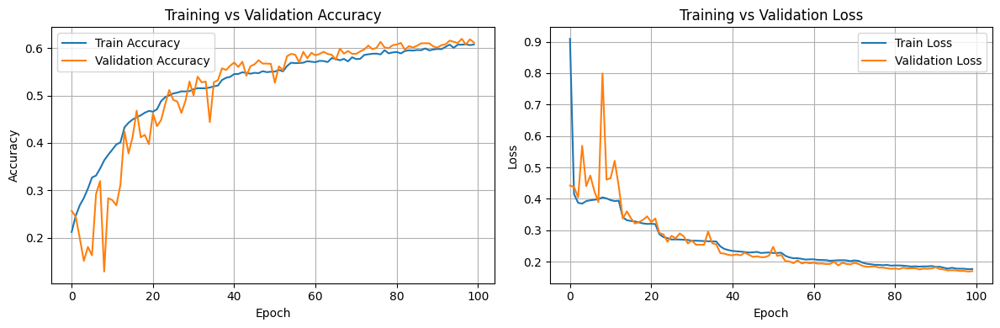

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(12, 4))  # Corrected 'Lfig' and set size here

# Accuracy
ax[0].plot(history.history['accuracy'], label='Train Accuracy')
ax[0].plot(history.history['val_accuracy'], label='Validation Accuracy')
ax[0].set_title('Training vs Validation Accuracy')
ax[0].set_xlabel('Epoch')
ax[0].set_ylabel('Accuracy')
ax[0].legend(loc='upper left')
ax[0].grid(True)

# Loss
ax[1].plot(history.history['loss'], label='Train Loss')
ax[1].plot(history.history['val_loss'], label='Validation Loss')
ax[1].set_title('Training vs Validation Loss')
ax[1].set_xlabel('Epoch')
ax[1].set_ylabel('Loss')
ax[1].legend(loc='upper right')
ax[1].grid(True)

plt.tight_layout()
plt.show()

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


225/225 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step


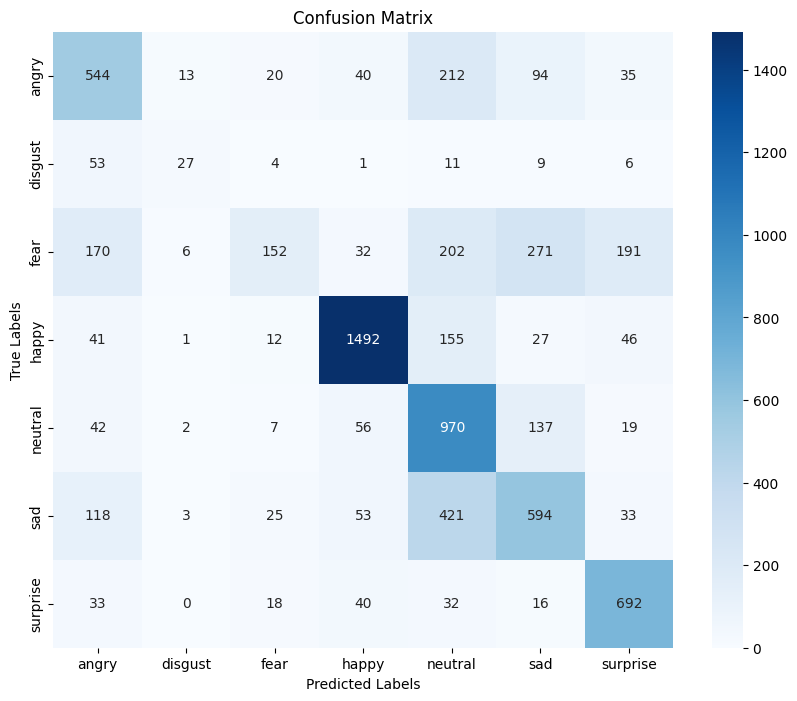


Classification Report:
              precision    recall  f1-score   support

       angry       0.54      0.57      0.56       958
     disgust       0.52      0.24      0.33       111
        fear       0.64      0.15      0.24      1024
       happy       0.87      0.84      0.86      1774
     neutral       0.48      0.79      0.60      1233
         sad       0.52      0.48      0.50      1247
    surprise       0.68      0.83      0.75       831

    accuracy                           0.62      7178
   macro avg       0.61      0.56      0.55      7178
weighted avg       0.64      0.62      0.60      7178



In [ ]:

y_prob = cnnModel.predict(test_generator, verbose=1)
y_pred = np.argmax(y_prob, axis=1)
y_true = test_generator.classes
label_map = test_generator.class_indices
label_map = {v: k for k, v in label_map.items()}
conf_matrix = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=list(label_map.values()),
            yticklabels=list(label_map.values()))
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()
print("\nClassification Report:")
print(classification_report(y_true, y_pred, target_names=list(label_map.values())))

225/225 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step


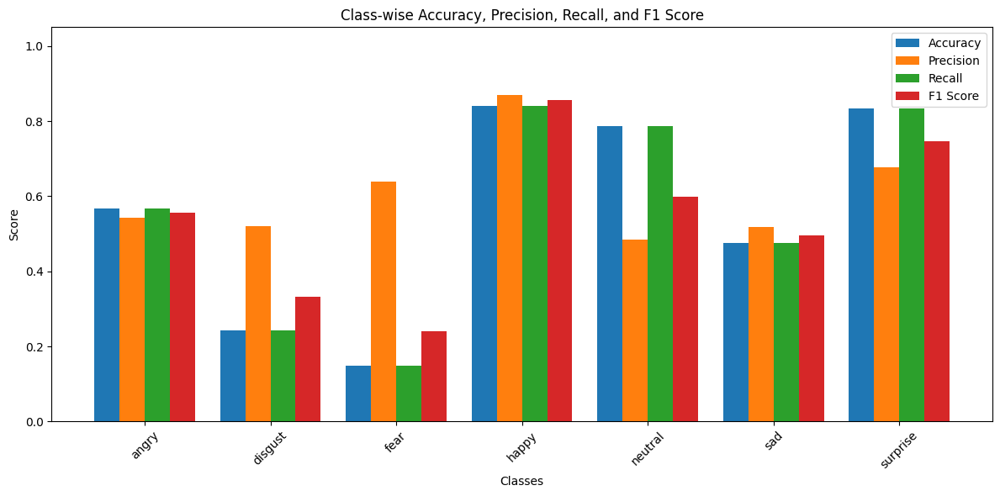


Classification Report:

              precision    recall  f1-score   support

       angry       0.54      0.57      0.56       958
     disgust       0.52      0.24      0.33       111
        fear       0.64      0.15      0.24      1024
       happy       0.87      0.84      0.86      1774
     neutral       0.48      0.79      0.60      1233
         sad       0.52      0.48      0.50      1247
    surprise       0.68      0.83      0.75       831

    accuracy                           0.62      7178
   macro avg       0.61      0.56      0.55      7178
weighted avg       0.64      0.62      0.60      7178

Class-wise Accuracy:
angry          : 56.78%
disgust        : 24.32%
fear           : 14.84%
happy          : 84.10%
neutral        : 78.67%
sad            : 47.63%
surprise       : 83.27%


In [ ]:

y_prob = cnnModel.predict(test_generator, verbose=1)
y_pred = np.argmax(y_prob, axis=1)
y_true = test_generator.classes


label_map = test_generator.class_indices
label_map = {v: k for k, v in label_map.items()}
class_names = [label_map[i] for i in range(len(label_map))]

# Confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)

# Class-wise accuracy
class_accuracy = []
for i in range(len(class_names)):
    correct = conf_matrix[i][i]
    total = conf_matrix[i].sum()
    acc = correct / total if total > 0 else 0
    class_accuracy.append(acc)

# Precision, Recall, F1
precision = precision_score(y_true, y_pred, average=None, zero_division=0)
recall = recall_score(y_true, y_pred, average=None, zero_division=0)
f1 = f1_score(y_true, y_pred, average=None, zero_division=0)

# Plot metrics
x = np.arange(len(class_names))
width = 0.2

plt.figure(figsize=(12, 6))
plt.bar(x - 1.5*width, class_accuracy, width, label='Accuracy')
plt.bar(x - 0.5*width, precision, width, label='Precision')
plt.bar(x + 0.5*width, recall, width, label='Recall')
plt.bar(x + 1.5*width, f1, width, label='F1 Score')

plt.xticks(x, class_names, rotation=45)
plt.ylim([0, 1.05])
plt.xlabel('Classes')
plt.ylabel('Score')
plt.title('Class-wise Accuracy, Precision, Recall, and F1 Score')
plt.legend()
plt.tight_layout()
plt.show()

# Print classification report
print("\nClassification Report:\n")
print(classification_report(y_true, y_pred, target_names=class_names, zero_division=0))

# Print class-wise accuracy
print("Class-wise Accuracy:")
for i, name in enumerate(class_names):
    print(f"{name:15s}: {class_accuracy[i]*100:.2f}%")



In [ ]:
test_loss, test_acc = cnnModel.evaluate(test_generator)
print(f"Test Accuracy: {test_acc:.2%}")

225/225 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - accuracy: 0.5455 - loss: 0.1921
Test Accuracy: 62.29%


# **Resnet Model**

In [ ]:
# Check if TensorFlow is installed and the version
import tensorflow as tf
print(f"TensorFlow Version: {tf.__version__}")

# Check for available GPUs
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    print(f" Using GPU: {gpus[0].name}")

    # Set memory growth to prevent TensorFlow from allocating all GPU memory at once
    tf.config.experimental.set_memory_growth(gpus[0], True)
    print(" Memory Growth enabled for GPU.")
else:
    print(" No GPU found. Training will run on CPU.")

TensorFlow Version: 2.18.0
 Using GPU: /physical_device:GPU:0
 Memory Growth enabled for GPU.


# **RESNET 18**

In [ ]:
# ========== 2. Data Generators ==========
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=10,
    zoom_range=0.1,
    horizontal_flip=True,
    validation_split=0.2
)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(48, 48),
    color_mode='rgb',
    batch_size=64,
    class_mode='categorical',
    shuffle=True,
    subset='training'
)

val_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(48, 48),
    color_mode='rgb',
    batch_size=64,
    class_mode='categorical',
    shuffle=False,
    subset='validation'
)

# Test generator (no augmentation)
test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(48, 48),
    color_mode='rgb',
    batch_size=64,
    class_mode='categorical',
    shuffle=False
)

Found 22968 images belonging to 7 classes.
Found 5741 images belonging to 7 classes.
Found 7178 images belonging to 7 classes.


In [ ]:
class_labels = np.array([0, 1, 2, 3, 4, 5, 6])
train_labels = train_generator.classes

class_weights = compute_class_weight(class_weight='balanced',
                                     classes=class_labels,
                                     y=train_labels)

class_weights_dict = dict(zip(class_labels, class_weights))
print("Class weights:", class_weights_dict)


Class weights: {np.int64(0): np.float64(1.0266404434114071), np.int64(1): np.float64(9.401555464592715), np.int64(2): np.float64(1.0009587727708533), np.int64(3): np.float64(0.5684585684585685), np.int64(4): np.float64(0.826068191627104), np.int64(5): np.float64(0.8491570541259982), np.int64(6): np.float64(1.2933160650937552)}


In [ ]:
from classification_models.tfkeras import Classifiers

# Load ResNet18
ResNet18, preprocess_input = Classifiers.get('resnet18')

# Define input shape
input_shape = (48, 48, 3)  # Grayscale images stacked into RGB

# Base model
base_model = ResNet18(input_shape=input_shape, weights=None, include_top=False)

# Add classification head
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.models import Model

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.3)(x)
x = Dense(128, activation='relu')(x)
output = Dense(7, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=output)

# Compile model
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

model.summary()

Model: "functional_144"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ data (InputLayer)   │ (None, 48, 48, 3) │          0 │ -                 │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_data             │ (None, 48, 48, 3) │          9 │ data[0][0]        │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 54, 54, 3) │          0 │ bn_data[0][0]     │
│ (ZeroPadding2D)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv0 (Conv2D)      │ (None, 24, 24,    │      9,408 │ zero_padding2d[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn0                 │ (None, 24, 24,    │        256 │ conv0[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ relu0 (Activation)  │ (None, 24, 24,    │          0 │ bn0[0][0]         │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, 26, 26,    │          0 │ relu0[0][0]       │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pooling0            │ (None, 12, 12,    │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stage1_unit1_bn1    │ (None, 12, 12,    │        256 │ pooling0[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stage1_unit1_relu1  │ (None, 12, 12,    │          0 │ stage1_unit1_bn1… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_2    │ (None, 14, 14,    │          0 │ stage1_unit1_rel… │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stage1_unit1_conv1  │ (None, 12, 12,    │     36,864 │ zero_padding2d_2… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stage1_unit1_bn2    │ (None, 12, 12,    │        256 │ stage1_unit1_con… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stage1_unit1_relu2  │ (None, 12, 12,    │          0 │ stage1_unit1_bn2… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_3    │ (None, 14, 14,    │          0 │ stage1_unit1_rel… │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stage1_unit1_conv2  │ (None, 12, 12,    │     36,864 │ zero_padding2d_3… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stage1_unit1_sc     │ (None, 12, 12,    │      4,096 │ stage1_unit1_rel… │
│ (Conv2D)            │ 64)               │            │                 

 Total params: 11,253,456 (42.93 MB)

 Trainable params: 11,245,514 (42.90 MB)

 Non-trainable params: 7,942 (31.02 KB)

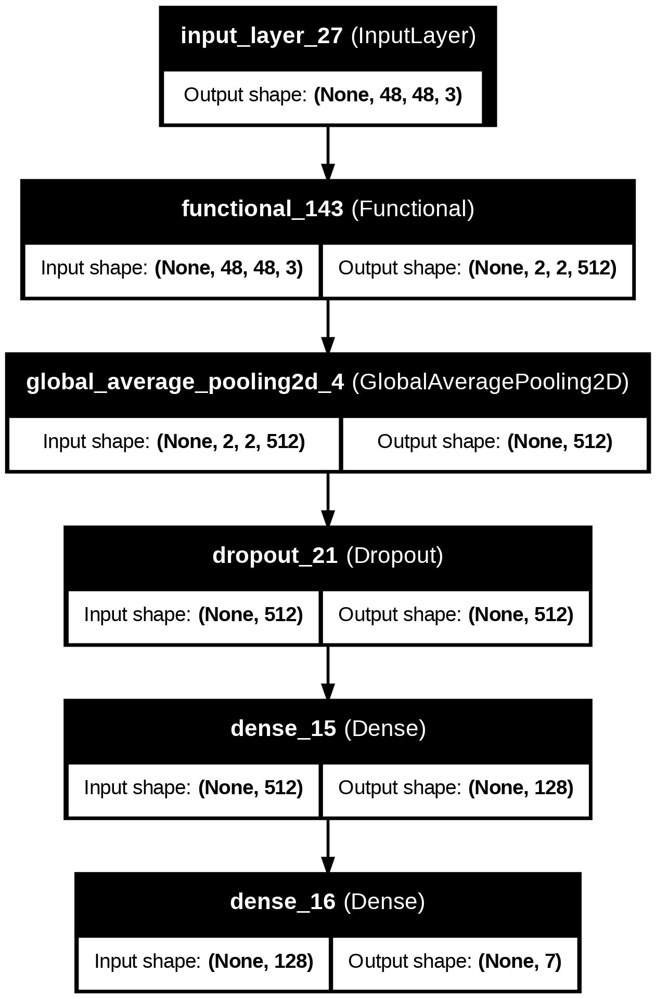

In [ ]:
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model
from tensorflow.keras.utils import plot_model
from IPython.display import Image

# Use the base_model (ResNet18 backbone) as a layer
input_tensor = Input(shape=(48, 48, 3))
x = base_model(input_tensor)
x = GlobalAveragePooling2D()(x)
x = Dropout(0.3)(x)
x = Dense(128, activation='relu')(x)
output = Dense(7, activation='softmax')(x)

combined_model = Model(inputs=input_tensor, outputs=output)

# Plot the model
plot_path = '/content/drive/MyDrive/DL Project/resnet18_combined.png'
plot_model(combined_model, to_file=plot_path, show_shapes=True, show_layer_names=True, rankdir='TB')

display(Image(plot_path))


In [ ]:
for i, layer in enumerate(model.layers):
    print(f"{i}: {layer.name} ({layer.__class__.__name__})")

0: data (InputLayer)
1: bn_data (BatchNormalization)
2: zero_padding2d (ZeroPadding2D)
3: conv0 (Conv2D)
4: bn0 (BatchNormalization)
5: relu0 (Activation)
6: zero_padding2d_1 (ZeroPadding2D)
7: pooling0 (MaxPooling2D)
8: stage1_unit1_bn1 (BatchNormalization)
9: stage1_unit1_relu1 (Activation)
10: zero_padding2d_2 (ZeroPadding2D)
11: stage1_unit1_conv1 (Conv2D)
12: stage1_unit1_bn2 (BatchNormalization)
13: stage1_unit1_relu2 (Activation)
14: zero_padding2d_3 (ZeroPadding2D)
15: stage1_unit1_conv2 (Conv2D)
16: stage1_unit1_sc (Conv2D)
17: add (Add)
18: stage1_unit2_bn1 (BatchNormalization)
19: stage1_unit2_relu1 (Activation)
20: zero_padding2d_4 (ZeroPadding2D)
21: stage1_unit2_conv1 (Conv2D)
22: stage1_unit2_bn2 (BatchNormalization)
23: stage1_unit2_relu2 (Activation)
24: zero_padding2d_5 (ZeroPadding2D)
25: stage1_unit2_conv2 (Conv2D)
26: add_1 (Add)
27: stage2_unit1_bn1 (BatchNormalization)
28: stage2_unit1_relu1 (Activation)
29: zero_padding2d_6 (ZeroPadding2D)
30: stage2_unit1_conv1

Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step - accuracy: 0.2088 - loss: 1.9197
Epoch 1: val_accuracy improved from -inf to 0.14928, saving model to /content/drive/MyDrive/best_model_resnet18_fer2013.h5


359/359 ━━━━━━━━━━━━━━━━━━━━ 78s 147ms/step - accuracy: 0.2089 - loss: 1.9194 - val_accuracy: 0.1493 - val_loss: 2.1495
Epoch 2/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.3334 - loss: 1.6843
Epoch 2: val_accuracy improved from 0.14928 to 0.34193, saving model to /content/drive/MyDrive/best_model_resnet18_fer2013.h5


359/359 ━━━━━━━━━━━━━━━━━━━━ 40s 112ms/step - accuracy: 0.3334 - loss: 1.6843 - val_accuracy: 0.3419 - val_loss: 1.7205
Epoch 3/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - accuracy: 0.3727 - loss: 1.6094
Epoch 3: val_accuracy improved from 0.34193 to 0.37154, saving model to /content/drive/MyDrive/best_model_resnet18_fer2013.h5


359/359 ━━━━━━━━━━━━━━━━━━━━ 45s 127ms/step - accuracy: 0.3727 - loss: 1.6093 - val_accuracy: 0.3715 - val_loss: 1.6359
Epoch 4/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.4075 - loss: 1.5156
Epoch 4: val_accuracy did not improve from 0.37154
359/359 ━━━━━━━━━━━━━━━━━━━━ 40s 111ms/step - accuracy: 0.4075 - loss: 1.5156 - val_accuracy: 0.3484 - val_loss: 1.7011
Epoch 5/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.4292 - loss: 1.4483
Epoch 5: val_accuracy improved from 0.37154 to 0.42275, saving model to /content/drive/MyDrive/best_model_resnet18_fer2013.h5


359/359 ━━━━━━━━━━━━━━━━━━━━ 40s 111ms/step - accuracy: 0.4292 - loss: 1.4484 - val_accuracy: 0.4227 - val_loss: 1.5219
Epoch 6/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.4492 - loss: 1.4035
Epoch 6: val_accuracy did not improve from 0.42275
359/359 ━━━━━━━━━━━━━━━━━━━━ 41s 109ms/step - accuracy: 0.4492 - loss: 1.4035 - val_accuracy: 0.4043 - val_loss: 1.5369
Epoch 7/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.4559 - loss: 1.3558
Epoch 7: val_accuracy improved from 0.42275 to 0.42832, saving model to /content/drive/MyDrive/best_model_resnet18_fer2013.h5


359/359 ━━━━━━━━━━━━━━━━━━━━ 44s 122ms/step - accuracy: 0.4559 - loss: 1.3558 - val_accuracy: 0.4283 - val_loss: 1.4818
Epoch 8/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.4715 - loss: 1.3466
Epoch 8: val_accuracy improved from 0.42832 to 0.43668, saving model to /content/drive/MyDrive/best_model_resnet18_fer2013.h5


359/359 ━━━━━━━━━━━━━━━━━━━━ 42s 117ms/step - accuracy: 0.4715 - loss: 1.3465 - val_accuracy: 0.4367 - val_loss: 1.4867
Epoch 9/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.4996 - loss: 1.2737
Epoch 9: val_accuracy improved from 0.43668 to 0.44243, saving model to /content/drive/MyDrive/best_model_resnet18_fer2013.h5


359/359 ━━━━━━━━━━━━━━━━━━━━ 41s 115ms/step - accuracy: 0.4996 - loss: 1.2737 - val_accuracy: 0.4424 - val_loss: 1.5111
Epoch 10/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.5080 - loss: 1.2369
Epoch 10: val_accuracy improved from 0.44243 to 0.48424, saving model to /content/drive/MyDrive/best_model_resnet18_fer2013.h5


359/359 ━━━━━━━━━━━━━━━━━━━━ 41s 114ms/step - accuracy: 0.5081 - loss: 1.2369 - val_accuracy: 0.4842 - val_loss: 1.3621
Epoch 11/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - accuracy: 0.5189 - loss: 1.2345
Epoch 11: val_accuracy improved from 0.48424 to 0.50235, saving model to /content/drive/MyDrive/best_model_resnet18_fer2013.h5


359/359 ━━━━━━━━━━━━━━━━━━━━ 41s 114ms/step - accuracy: 0.5190 - loss: 1.2344 - val_accuracy: 0.5024 - val_loss: 1.3072
Epoch 12/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - accuracy: 0.5457 - loss: 1.1403
Epoch 12: val_accuracy improved from 0.50235 to 0.50270, saving model to /content/drive/MyDrive/best_model_resnet18_fer2013.h5


359/359 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - accuracy: 0.5457 - loss: 1.1403 - val_accuracy: 0.5027 - val_loss: 1.3247
Epoch 13/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.5527 - loss: 1.1095
Epoch 13: val_accuracy did not improve from 0.50270
359/359 ━━━━━━━━━━━━━━━━━━━━ 39s 108ms/step - accuracy: 0.5527 - loss: 1.1096 - val_accuracy: 0.5015 - val_loss: 1.3320
Epoch 14/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.5623 - loss: 1.0732
Epoch 14: val_accuracy did not improve from 0.50270
359/359 ━━━━━━━━━━━━━━━━━━━━ 37s 104ms/step - accuracy: 0.5623 - loss: 1.0733 - val_accuracy: 0.4848 - val_loss: 1.3694
Epoch 15/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - accuracy: 0.5607 - loss: 1.0821
Epoch 15: val_accuracy did not improve from 0.50270
359/359 ━━━━━━━━━━━━━━━━━━━━ 38s 105ms/step - accuracy: 0.5607 - loss: 1.0821 - val_accuracy: 0.4994 - val_loss: 1.3280
Epoch 16/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.5716 - loss: 1.0637
Epoch 16

359/359 ━━━━━━━━━━━━━━━━━━━━ 44s 113ms/step - accuracy: 0.5716 - loss: 1.0637 - val_accuracy: 0.5431 - val_loss: 1.2108
Epoch 17/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.5941 - loss: 1.0104
Epoch 17: val_accuracy did not improve from 0.54311
359/359 ━━━━━━━━━━━━━━━━━━━━ 39s 109ms/step - accuracy: 0.5941 - loss: 1.0104 - val_accuracy: 0.4976 - val_loss: 1.3591
Epoch 18/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.6040 - loss: 0.9792
Epoch 18: val_accuracy did not improve from 0.54311
359/359 ━━━━━━━━━━━━━━━━━━━━ 36s 99ms/step - accuracy: 0.6040 - loss: 0.9792 - val_accuracy: 0.5391 - val_loss: 1.2243
Epoch 19/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - accuracy: 0.6193 - loss: 0.9315
Epoch 19: val_accuracy did not improve from 0.54311
359/359 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - accuracy: 0.6192 - loss: 0.9316 - val_accuracy: 0.5159 - val_loss: 1.2942
Epoch 20/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.6275 - loss: 0.9230
Epoch 20:

359/359 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - accuracy: 0.6274 - loss: 0.9230 - val_accuracy: 0.5462 - val_loss: 1.2320
Epoch 21/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - accuracy: 0.6249 - loss: 0.9350
Epoch 21: val_accuracy improved from 0.54625 to 0.54921, saving model to /content/drive/MyDrive/best_model_resnet18_fer2013.h5


359/359 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - accuracy: 0.6249 - loss: 0.9350 - val_accuracy: 0.5492 - val_loss: 1.2095
Epoch 22/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.6478 - loss: 0.8671
Epoch 22: val_accuracy did not improve from 0.54921
359/359 ━━━━━━━━━━━━━━━━━━━━ 39s 108ms/step - accuracy: 0.6477 - loss: 0.8672 - val_accuracy: 0.5330 - val_loss: 1.2768
Epoch 23/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.6563 - loss: 0.8474
Epoch 23: val_accuracy improved from 0.54921 to 0.55391, saving model to /content/drive/MyDrive/best_model_resnet18_fer2013.h5


359/359 ━━━━━━━━━━━━━━━━━━━━ 39s 110ms/step - accuracy: 0.6562 - loss: 0.8475 - val_accuracy: 0.5539 - val_loss: 1.2049
Epoch 24/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - accuracy: 0.6518 - loss: 0.8533
Epoch 24: val_accuracy did not improve from 0.55391
359/359 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - accuracy: 0.6518 - loss: 0.8534 - val_accuracy: 0.5475 - val_loss: 1.2551
Epoch 25/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - accuracy: 0.6695 - loss: 0.8120
Epoch 25: val_accuracy improved from 0.55391 to 0.55635, saving model to /content/drive/MyDrive/best_model_resnet18_fer2013.h5


359/359 ━━━━━━━━━━━━━━━━━━━━ 40s 111ms/step - accuracy: 0.6695 - loss: 0.8120 - val_accuracy: 0.5563 - val_loss: 1.2222
Epoch 26/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - accuracy: 0.6730 - loss: 0.7929
Epoch 26: val_accuracy improved from 0.55635 to 0.55931, saving model to /content/drive/MyDrive/best_model_resnet18_fer2013.h5


359/359 ━━━━━━━━━━━━━━━━━━━━ 43s 120ms/step - accuracy: 0.6729 - loss: 0.7929 - val_accuracy: 0.5593 - val_loss: 1.2277
Epoch 27/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.6901 - loss: 0.7514
Epoch 27: val_accuracy did not improve from 0.55931
359/359 ━━━━━━━━━━━━━━━━━━━━ 39s 108ms/step - accuracy: 0.6901 - loss: 0.7515 - val_accuracy: 0.5320 - val_loss: 1.3208
Epoch 28/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.6951 - loss: 0.7399
Epoch 28: val_accuracy improved from 0.55931 to 0.55966, saving model to /content/drive/MyDrive/best_model_resnet18_fer2013.h5


359/359 ━━━━━━━━━━━━━━━━━━━━ 40s 112ms/step - accuracy: 0.6951 - loss: 0.7399 - val_accuracy: 0.5597 - val_loss: 1.2747
Epoch 29/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - accuracy: 0.6950 - loss: 0.7434
Epoch 29: val_accuracy did not improve from 0.55966
359/359 ━━━━━━━━━━━━━━━━━━━━ 39s 109ms/step - accuracy: 0.6950 - loss: 0.7434 - val_accuracy: 0.5311 - val_loss: 1.3582
Epoch 30/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.7098 - loss: 0.7263
Epoch 30: val_accuracy did not improve from 0.55966
359/359 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - accuracy: 0.7098 - loss: 0.7263 - val_accuracy: 0.5593 - val_loss: 1.2508
Epoch 31/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.7383 - loss: 0.6504
Epoch 31: val_accuracy improved from 0.55966 to 0.57133, saving model to /content/drive/MyDrive/best_model_resnet18_fer2013.h5


359/359 ━━━━━━━━━━━━━━━━━━━━ 44s 122ms/step - accuracy: 0.7383 - loss: 0.6504 - val_accuracy: 0.5713 - val_loss: 1.2710
Epoch 32/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - accuracy: 0.7452 - loss: 0.6177
Epoch 32: val_accuracy did not improve from 0.57133
359/359 ━━━━━━━━━━━━━━━━━━━━ 75s 104ms/step - accuracy: 0.7452 - loss: 0.6177 - val_accuracy: 0.5607 - val_loss: 1.3253
Epoch 33/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.7584 - loss: 0.6027
Epoch 33: val_accuracy did not improve from 0.57133
359/359 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - accuracy: 0.7584 - loss: 0.6027 - val_accuracy: 0.5635 - val_loss: 1.3338
Epoch 34/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.7618 - loss: 0.5903
Epoch 34: val_accuracy did not improve from 0.57133
359/359 ━━━━━━━━━━━━━━━━━━━━ 36s 100ms/step - accuracy: 0.7618 - loss: 0.5904 - val_accuracy: 0.5675 - val_loss: 1.3051
Epoch 35/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.7762 - loss: 0.5590
Epoch 35

359/359 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - accuracy: 0.8045 - loss: 0.4819 - val_accuracy: 0.5781 - val_loss: 1.4481
Epoch 39/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.8038 - loss: 0.4758
Epoch 39: val_accuracy did not improve from 0.57812
359/359 ━━━━━━━━━━━━━━━━━━━━ 78s 107ms/step - accuracy: 0.8038 - loss: 0.4758 - val_accuracy: 0.5550 - val_loss: 1.4279
Epoch 40/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.8193 - loss: 0.4510
Epoch 40: val_accuracy did not improve from 0.57812
359/359 ━━━━━━━━━━━━━━━━━━━━ 37s 104ms/step - accuracy: 0.8193 - loss: 0.4511 - val_accuracy: 0.5464 - val_loss: 1.5018
Epoch 41/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.8214 - loss: 0.4431
Epoch 41: val_accuracy did not improve from 0.57812
359/359 ━━━━━━━━━━━━━━━━━━━━ 36s 101ms/step - accuracy: 0.8214 - loss: 0.4431 - val_accuracy: 0.5633 - val_loss: 1.4800
Epoch 42/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - accuracy: 0.8416 - loss: 0.3934
Epoch 42

359/359 ━━━━━━━━━━━━━━━━━━━━ 44s 122ms/step - accuracy: 0.8823 - loss: 0.2866 - val_accuracy: 0.5788 - val_loss: 1.6820
Epoch 49/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - accuracy: 0.8855 - loss: 0.2907
Epoch 49: val_accuracy did not improve from 0.57882
359/359 ━━━━━━━━━━━━━━━━━━━━ 40s 110ms/step - accuracy: 0.8855 - loss: 0.2908 - val_accuracy: 0.5701 - val_loss: 1.6250
Epoch 50/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.8691 - loss: 0.3411
Epoch 50: val_accuracy did not improve from 0.57882
359/359 ━━━━━━━━━━━━━━━━━━━━ 37s 103ms/step - accuracy: 0.8691 - loss: 0.3411 - val_accuracy: 0.5570 - val_loss: 1.6749
Epoch 51/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.8774 - loss: 0.3030
Epoch 51: val_accuracy did not improve from 0.57882
359/359 ━━━━━━━━━━━━━━━━━━━━ 41s 103ms/step - accuracy: 0.8774 - loss: 0.3030 - val_accuracy: 0.5508 - val_loss: 1.7110
Epoch 52/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.8942 - loss: 0.2657
Epoch 52

359/359 ━━━━━━━━━━━━━━━━━━━━ 40s 112ms/step - accuracy: 0.9104 - loss: 0.2317 - val_accuracy: 0.5851 - val_loss: 1.7332
Epoch 57/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.9158 - loss: 0.2165
Epoch 57: val_accuracy did not improve from 0.58509
359/359 ━━━━━━━━━━━━━━━━━━━━ 40s 109ms/step - accuracy: 0.9157 - loss: 0.2166 - val_accuracy: 0.5595 - val_loss: 1.8513
Epoch 58/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.9102 - loss: 0.2246
Epoch 58: val_accuracy did not improve from 0.58509
359/359 ━━━━━━━━━━━━━━━━━━━━ 37s 102ms/step - accuracy: 0.9102 - loss: 0.2247 - val_accuracy: 0.5706 - val_loss: 1.7774
Epoch 59/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - accuracy: 0.9112 - loss: 0.2264
Epoch 59: val_accuracy did not improve from 0.58509
359/359 ━━━━━━━━━━━━━━━━━━━━ 38s 105ms/step - accuracy: 0.9112 - loss: 0.2264 - val_accuracy: 0.5705 - val_loss: 1.7884
Epoch 60/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.9183 - loss: 0.2012
Epoch 60

359/359 ━━━━━━━━━━━━━━━━━━━━ 42s 116ms/step - accuracy: 0.9488 - loss: 0.1305 - val_accuracy: 0.5881 - val_loss: 2.0088
Epoch 80/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - accuracy: 0.9453 - loss: 0.1339
Epoch 80: val_accuracy improved from 0.58805 to 0.58997, saving model to /content/drive/MyDrive/best_model_resnet18_fer2013.h5


359/359 ━━━━━━━━━━━━━━━━━━━━ 43s 119ms/step - accuracy: 0.9453 - loss: 0.1339 - val_accuracy: 0.5900 - val_loss: 2.0548
Epoch 81/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - accuracy: 0.9306 - loss: 0.1932
Epoch 81: val_accuracy did not improve from 0.58997
359/359 ━━━━━━━━━━━━━━━━━━━━ 40s 113ms/step - accuracy: 0.9305 - loss: 0.1932 - val_accuracy: 0.5766 - val_loss: 2.0370
Epoch 82/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - accuracy: 0.9506 - loss: 0.1306
Epoch 82: val_accuracy did not improve from 0.58997
359/359 ━━━━━━━━━━━━━━━━━━━━ 41s 114ms/step - accuracy: 0.9506 - loss: 0.1306 - val_accuracy: 0.5783 - val_loss: 2.1032
Epoch 83/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - accuracy: 0.9467 - loss: 0.1388
Epoch 83: val_accuracy did not improve from 0.58997
359/359 ━━━━━━━━━━━━━━━━━━━━ 38s 106ms/step - accuracy: 0.9467 - loss: 0.1388 - val_accuracy: 0.5717 - val_loss: 2.0927
Epoch 84/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - accuracy: 0.9487 - loss: 0.1362
Epoch 84

359/359 ━━━━━━━━━━━━━━━━━━━━ 40s 110ms/step - accuracy: 0.9614 - loss: 0.1000 - val_accuracy: 0.5912 - val_loss: 2.1259
Epoch 93/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.9605 - loss: 0.1002
Epoch 93: val_accuracy did not improve from 0.59119
359/359 ━━━━━━━━━━━━━━━━━━━━ 39s 109ms/step - accuracy: 0.9605 - loss: 0.1002 - val_accuracy: 0.5797 - val_loss: 2.1627
Epoch 94/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.9612 - loss: 0.1016
Epoch 94: val_accuracy did not improve from 0.59119
359/359 ━━━━━━━━━━━━━━━━━━━━ 40s 112ms/step - accuracy: 0.9612 - loss: 0.1016 - val_accuracy: 0.5788 - val_loss: 2.1471
Epoch 95/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - accuracy: 0.9473 - loss: 0.1336
Epoch 95: val_accuracy did not improve from 0.59119
359/359 ━━━━━━━━━━━━━━━━━━━━ 38s 106ms/step - accuracy: 0.9473 - loss: 0.1336 - val_accuracy: 0.5719 - val_loss: 2.2709
Epoch 96/100
359/359 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - accuracy: 0.9598 - loss: 0.1075
Epoch 96

Final model saved.


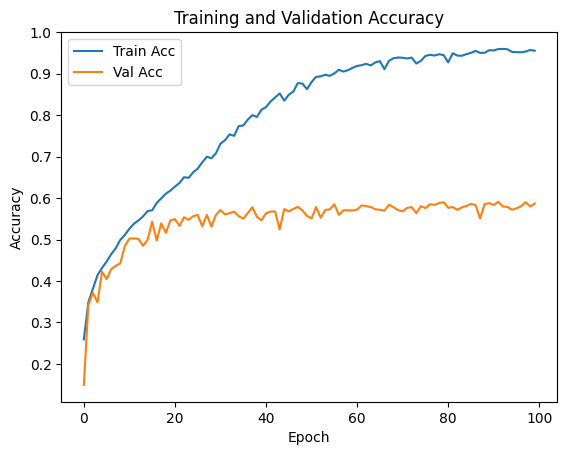

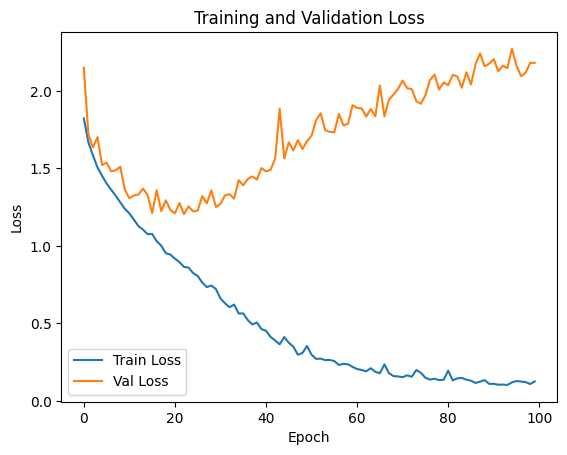

113/113 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - accuracy: 0.5722 - loss: 2.3048

Test Accuracy: 0.6041
Test Loss: 2.0577
113/113 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step

Classification Report:
              precision    recall  f1-score   support

       angry       0.49      0.54      0.51       958
     disgust       0.70      0.51      0.59       111
        fear       0.49      0.44      0.46      1024
       happy       0.81      0.78      0.79      1774
     neutral       0.53      0.58      0.56      1233
         sad       0.49      0.45      0.47      1247
    surprise       0.71      0.79      0.75       831

    accuracy                           0.60      7178
   macro avg       0.60      0.58      0.59      7178
weighted avg       0.60      0.60      0.60      7178



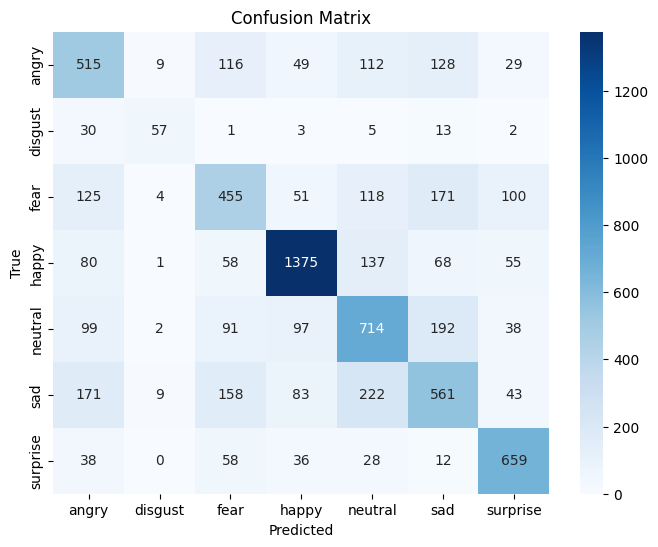

In [ ]:
checkpoint_path = "/content/drive/MyDrive/best_model_resnet18_fer2013.h5"

checkpoint = ModelCheckpoint(
    checkpoint_path,
    monitor='val_accuracy',
    save_best_only=True,
    verbose=1,
    mode='max'
)

early_stop = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True,
    verbose=1
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    verbose=1
)

# ========== 6. Train the Model ==========
history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=100,
    class_weight=class_weights_dict,
    callbacks=[checkpoint]
)

# ========== 7. Save Final Model ==========
model.save("final_model_resnet18_fer2013.h5")
print("Final model saved.")

# ========== 8. Plot Training History ==========
plt.plot(history.history['accuracy'], label='Train Acc')
plt.plot(history.history['val_accuracy'], label='Val Acc')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# ========== 9. Evaluate on Test Set ==========
test_loss, test_acc = model.evaluate(test_generator)
print(f"\nTest Accuracy: {test_acc:.4f}")
print(f"Test Loss: {test_loss:.4f}")

# ========== 10. Classification Report & Confusion Matrix ==========
y_pred_probs = model.predict(test_generator)
y_pred = np.argmax(y_pred_probs, axis=1)
y_true = test_generator.classes

labels = list(test_generator.class_indices.keys())

print("\nClassification Report:")
print(classification_report(y_true, y_pred, target_names=labels))

cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# **Class Wise Accuracy**

In [ ]:
class_accuracy = cm.diagonal() / cm.sum(axis=1)

# Print class-wise accuracy
print("\nClass-wise Accuracy:")
for idx, label in enumerate(labels):
    print(f"{label}: {class_accuracy[idx]*100:.2f}%")


Class-wise Accuracy:
angry: 53.76%
disgust: 51.35%
fear: 44.43%
happy: 77.51%
neutral: 57.91%
sad: 44.99%
surprise: 79.30%


# **Performance Metrics Plot**

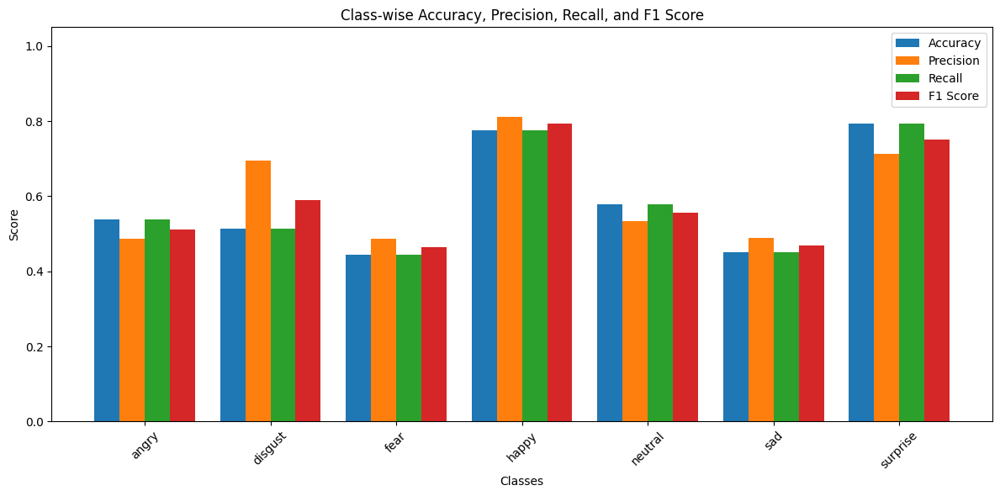

Class-wise Metrics:
angry: Accuracy=0.538, Precision=0.487, Recall=0.538, F1=0.511
disgust: Accuracy=0.514, Precision=0.695, Recall=0.514, F1=0.591
fear: Accuracy=0.444, Precision=0.486, Recall=0.444, F1=0.464
happy: Accuracy=0.775, Precision=0.812, Recall=0.775, F1=0.793
neutral: Accuracy=0.579, Precision=0.534, Recall=0.579, F1=0.556
sad: Accuracy=0.450, Precision=0.490, Recall=0.450, F1=0.469
surprise: Accuracy=0.793, Precision=0.712, Recall=0.793, F1=0.750


In [ ]:

class_accuracy = cm.diagonal() / cm.sum(axis=1)

# Compute precision, recall, f1-score for each class
precision, recall, f1_score, _ = precision_recall_fscore_support(y_true, y_pred, zero_division=0)

# Plotting
x = np.arange(len(labels))
width = 0.2

plt.figure(figsize=(12, 6))

plt.bar(x - 1.5*width, class_accuracy, width, label='Accuracy')
plt.bar(x - 0.5*width, precision, width, label='Precision')
plt.bar(x + 0.5*width, recall, width, label='Recall')
plt.bar(x + 1.5*width, f1_score, width, label='F1 Score')

plt.xticks(x, labels, rotation=45)
plt.ylim([0, 1.05])
plt.xlabel('Classes')
plt.ylabel('Score')
plt.title('Class-wise Accuracy, Precision, Recall, and F1 Score')
plt.legend()
plt.tight_layout()
plt.show()

# Optional: print numeric values
print("Class-wise Metrics:")
for i, label in enumerate(labels):
    print(f"{label}: Accuracy={class_accuracy[i]:.3f}, Precision={precision[i]:.3f}, Recall={recall[i]:.3f}, F1={f1_score[i]:.3f}")


# **Resnet With Class Weights and Focal Loss**

In [ ]:
def focal_loss(gamma=2., alpha=0.25):
    def focal_loss_fixed(y_true, y_pred):
        epsilon = 1e-7
        y_pred = tf.clip_by_value(y_pred, epsilon, 1. - epsilon)
        cross_entropy = -y_true * tf.math.log(y_pred)
        weight = alpha * tf.math.pow(1 - y_pred, gamma)
        loss = weight * cross_entropy
        return tf.reduce_sum(loss, axis=1)
    return focal_loss_fixed

In [ ]:

input_shape = (48, 48, 3)
batch_size = 32

ResNet18, preprocess_input = Classifiers.get('resnet18')

train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rotation_range=15,
    zoom_range=0.15,
    shear_range=0.1,
    brightness_range=[0.8, 1.2],
    horizontal_flip=True,
    validation_split=0.2
)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(48, 48),
    batch_size=batch_size,
    class_mode='categorical',
    subset='training',
    shuffle=True
)

val_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(48, 48),
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation',
    shuffle=False
)

test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(48, 48),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)


Found 22968 images belonging to 7 classes.
Found 5741 images belonging to 7 classes.
Found 7178 images belonging to 7 classes.


# **Class Weights**

In [ ]:
class_labels = np.array([0, 1, 2, 3, 4, 5, 6])
train_labels = train_generator.classes
class_weights = compute_class_weight(class_weight='balanced', classes=class_labels, y=train_labels)
class_weights_dict = dict(zip(class_labels, class_weights))

# **Model**

In [ ]:

base_model = ResNet18(input_shape=input_shape, weights='imagenet', include_top=False)
for layer in base_model.layers:
    layer.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = BatchNormalization()(x)
x = Dropout(0.5)(x)
x = Dense(128, activation='relu')(x)
x = BatchNormalization()(x)
output = Dense(7, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=output)

44920640/44920640 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


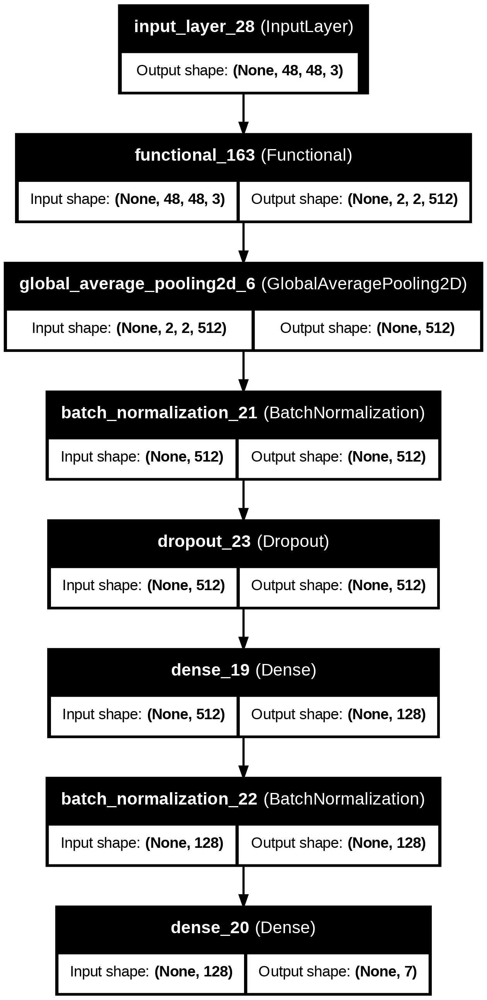

In [ ]:
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model
from tensorflow.keras.utils import plot_model
from IPython.display import Image

# Assume base_model is defined and frozen already
# base_model = ResNet18(..., weights='imagenet', include_top=False)
# for layer in base_model.layers:
#     layer.trainable = False

input_tensor = Input(shape=(48, 48, 3))
x = base_model(input_tensor)  # Backbone as one block
x = GlobalAveragePooling2D()(x)
x = BatchNormalization()(x)
x = Dropout(0.5)(x)
x = Dense(128, activation='relu')(x)
x = BatchNormalization()(x)
output = Dense(7, activation='softmax')(x)

combined_model = Model(inputs=input_tensor, outputs=output)

# Plot model with backbone collapsed as one block
plot_path = '/content/drive/MyDrive/DL Project/resnet18_frozen_combined.png'
plot_model(combined_model, to_file=plot_path, show_shapes=True, show_layer_names=True, rankdir='TB')

display(Image(plot_path))


In [ ]:
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ data (InputLayer)   │ (None, 48, 48, 3) │          0 │ -                 │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_data             │ (None, 48, 48, 3) │          9 │ data[0][0]        │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 54, 54, 3) │          0 │ bn_data[0][0]     │
│ (ZeroPadding2D)     │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv0 (Conv2D)      │ (None, 24, 24,    │      9,408 │ zero_padding2d[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn0                 │ (None, 24, 24,    │        256 │ conv0[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ relu0 (Activation)  │ (None, 24, 24,    │          0 │ bn0[0][0]         │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, 26, 26,    │          0 │ relu0[0][0]       │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pooling0            │ (None, 12, 12,    │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stage1_unit1_bn1    │ (None, 12, 12,    │        256 │ pooling0[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stage1_unit1_relu1  │ (None, 12, 12,    │          0 │ stage1_unit1_bn1… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_2    │ (None, 14, 14,    │          0 │ stage1_unit1_rel… │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stage1_unit1_conv1  │ (None, 12, 12,    │     36,864 │ zero_padding2d_2… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stage1_unit1_bn2    │ (None, 12, 12,    │        256 │ stage1_unit1_con… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stage1_unit1_relu2  │ (None, 12, 12,    │          0 │ stage1_unit1_bn2… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_3    │ (None, 14, 14,    │          0 │ stage1_unit1_rel… │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stage1_unit1_conv2  │ (None, 12, 12,    │     36,864 │ zero_padding2d_3… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stage1_unit1_sc     │ (None, 12, 12,    │      4,096 │ stage1_unit1_rel… │
│ (Conv2D)            │ 64)               │            │                 

 Total params: 11,256,016 (42.94 MB)

 Trainable params: 67,847 (265.03 KB)

 Non-trainable params: 11,188,169 (42.68 MB)

In [ ]:
from tensorflow.keras.utils import plot_model
from IPython.display import Image
plot_model(model, to_file='convnet.png', show_shapes=True,show_layer_names=True)
Image(filename='convnet.png')

In [ ]:
model.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss=focal_loss(gamma=2., alpha=0.25),
    metrics=['accuracy']
)

# ========== Callbacks ==========
checkpoint_path = "/content/drive/MyDrive/DL Project/best_model_resnet18_focal.h5"
callbacks = [
    ModelCheckpoint(checkpoint_path, monitor='val_accuracy', save_best_only=True, mode='max', verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1)
]


Epoch 1/30


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.2362 - loss: 0.4038
Epoch 1: val_accuracy improved from -inf to 0.33130, saving model to /content/drive/MyDrive/DL Project/best_model_resnet18_focal.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - accuracy: 0.2362 - loss: 0.4036 - val_accuracy: 0.3313 - val_loss: 0.2951 - learning_rate: 0.0010
Epoch 2/30
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - accuracy: 0.3098 - loss: 0.3041
Epoch 2: val_accuracy improved from 0.33130 to 0.33827, saving model to /content/drive/MyDrive/DL Project/best_model_resnet18_focal.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 43s 59ms/step - accuracy: 0.3098 - loss: 0.3041 - val_accuracy: 0.3383 - val_loss: 0.2871 - learning_rate: 0.0010
Epoch 3/30
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - accuracy: 0.3240 - loss: 0.2951
Epoch 3: val_accuracy improved from 0.33827 to 0.35551, saving model to /content/drive/MyDrive/DL Project/best_model_resnet18_focal.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step - accuracy: 0.3240 - loss: 0.2951 - val_accuracy: 0.3555 - val_loss: 0.2809 - learning_rate: 0.0010
Epoch 4/30
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - accuracy: 0.3377 - loss: 0.2871
Epoch 4: val_accuracy improved from 0.35551 to 0.37345, saving model to /content/drive/MyDrive/DL Project/best_model_resnet18_focal.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step - accuracy: 0.3377 - loss: 0.2871 - val_accuracy: 0.3735 - val_loss: 0.2767 - learning_rate: 0.0010
Epoch 5/30
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - accuracy: 0.3363 - loss: 0.2859
Epoch 5: val_accuracy did not improve from 0.37345
718/718 ━━━━━━━━━━━━━━━━━━━━ 44s 62ms/step - accuracy: 0.3363 - loss: 0.2859 - val_accuracy: 0.3677 - val_loss: 0.2760 - learning_rate: 0.0010
Epoch 6/30
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - accuracy: 0.3351 - loss: 0.2851
Epoch 6: val_accuracy did not improve from 0.37345
718/718 ━━━━━━━━━━━━━━━━━━━━ 78s 57ms/step - accuracy: 0.3351 - loss: 0.2851 - val_accuracy: 0.3715 - val_loss: 0.2757 - learning_rate: 0.0010
Epoch 7/30
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - accuracy: 0.3455 - loss: 0.2806
Epoch 7: val_accuracy improved from 0.37345 to 0.37990, saving model to /content/drive/MyDrive/DL Project/best_model_resnet18_focal.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 42s 59ms/step - accuracy: 0.3455 - loss: 0.2806 - val_accuracy: 0.3799 - val_loss: 0.2696 - learning_rate: 0.0010
Epoch 8/30
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - accuracy: 0.3580 - loss: 0.2740
Epoch 8: val_accuracy did not improve from 0.37990
718/718 ━━━━━━━━━━━━━━━━━━━━ 42s 58ms/step - accuracy: 0.3580 - loss: 0.2740 - val_accuracy: 0.3703 - val_loss: 0.2737 - learning_rate: 0.0010
Epoch 9/30
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - accuracy: 0.3536 - loss: 0.2807
Epoch 9: val_accuracy did not improve from 0.37990
718/718 ━━━━━━━━━━━━━━━━━━━━ 40s 56ms/step - accuracy: 0.3536 - loss: 0.2807 - val_accuracy: 0.3735 - val_loss: 0.2733 - learning_rate: 0.0010
Epoch 10/30
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - accuracy: 0.3525 - loss: 0.2733
Epoch 10: val_accuracy did not improve from 0.37990
718/718 ━━━━━━━━━━━━━━━━━━━━ 40s 56ms/step - accuracy: 0.3525 - loss: 0.2733 - val_accuracy: 0.3796 - val_loss: 0.2715 - learning_rate: 0.0010
Epoch 11/30


718/718 ━━━━━━━━━━━━━━━━━━━━ 42s 59ms/step - accuracy: 0.3612 - loss: 0.2650 - val_accuracy: 0.3881 - val_loss: 0.2647 - learning_rate: 5.0000e-04
Epoch 16/30
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - accuracy: 0.3653 - loss: 0.2720
Epoch 16: val_accuracy improved from 0.38809 to 0.39192, saving model to /content/drive/MyDrive/DL Project/best_model_resnet18_focal.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 42s 58ms/step - accuracy: 0.3653 - loss: 0.2720 - val_accuracy: 0.3919 - val_loss: 0.2638 - learning_rate: 5.0000e-04
Epoch 17/30
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - accuracy: 0.3615 - loss: 0.2671
Epoch 17: val_accuracy did not improve from 0.39192
718/718 ━━━━━━━━━━━━━━━━━━━━ 82s 59ms/step - accuracy: 0.3615 - loss: 0.2671 - val_accuracy: 0.3830 - val_loss: 0.2658 - learning_rate: 5.0000e-04
Epoch 18/30
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - accuracy: 0.3741 - loss: 0.2637
Epoch 18: val_accuracy did not improve from 0.39192
718/718 ━━━━━━━━━━━━━━━━━━━━ 43s 59ms/step - accuracy: 0.3740 - loss: 0.2637 - val_accuracy: 0.3755 - val_loss: 0.2680 - learning_rate: 5.0000e-04
Epoch 19/30
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - accuracy: 0.3597 - loss: 0.2645
Epoch 19: val_accuracy did not improve from 0.39192
718/718 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - accuracy: 0.3597 - loss: 0.2645 - val_accuracy: 0.3914 - val_loss: 0.2624 - learning_rate: 5.0

718/718 ━━━━━━━━━━━━━━━━━━━━ 43s 59ms/step - accuracy: 0.3766 - loss: 0.2582 - val_accuracy: 0.3930 - val_loss: 0.2648 - learning_rate: 5.0000e-04
Epoch 26/30
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - accuracy: 0.3701 - loss: 0.2590
Epoch 26: val_accuracy did not improve from 0.39296
718/718 ━━━━━━━━━━━━━━━━━━━━ 79s 56ms/step - accuracy: 0.3701 - loss: 0.2590 - val_accuracy: 0.3823 - val_loss: 0.2642 - learning_rate: 5.0000e-04
Epoch 27/30
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - accuracy: 0.3746 - loss: 0.2654
Epoch 27: val_accuracy did not improve from 0.39296
718/718 ━━━━━━━━━━━━━━━━━━━━ 41s 57ms/step - accuracy: 0.3746 - loss: 0.2654 - val_accuracy: 0.3884 - val_loss: 0.2614 - learning_rate: 5.0000e-04
Epoch 28/30
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - accuracy: 0.3772 - loss: 0.2591
Epoch 28: val_accuracy did not improve from 0.39296
718/718 ━━━━━━━━━━━━━━━━━━━━ 42s 59ms/step - accuracy: 0.3772 - loss: 0.2591 - val_accuracy: 0.3891 - val_loss: 0.2632 - learning_rate: 5.0

718/718 ━━━━━━━━━━━━━━━━━━━━ 42s 59ms/step - accuracy: 0.3674 - loss: 0.2600 - val_accuracy: 0.3935 - val_loss: 0.2597 - learning_rate: 5.0000e-04
Epoch 30/30
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - accuracy: 0.3718 - loss: 0.2596
Epoch 30: val_accuracy improved from 0.39349 to 0.39627, saving model to /content/drive/MyDrive/DL Project/best_model_resnet18_focal.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 83s 61ms/step - accuracy: 0.3718 - loss: 0.2596 - val_accuracy: 0.3963 - val_loss: 0.2599 - learning_rate: 5.0000e-04
Epoch 1/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.3030 - loss: 0.3122
Epoch 1: val_accuracy did not improve from 0.39627
718/718 ━━━━━━━━━━━━━━━━━━━━ 62s 73ms/step - accuracy: 0.3031 - loss: 0.3121 - val_accuracy: 0.3909 - val_loss: 0.2635 - learning_rate: 1.0000e-04
Epoch 2/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - accuracy: 0.3844 - loss: 0.2537
Epoch 2: val_accuracy improved from 0.39627 to 0.42397, saving model to /content/drive/MyDrive/DL Project/best_model_resnet18_focal.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - accuracy: 0.3844 - loss: 0.2537 - val_accuracy: 0.4240 - val_loss: 0.2473 - learning_rate: 1.0000e-04
Epoch 3/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.4187 - loss: 0.2352
Epoch 3: val_accuracy did not improve from 0.42397
718/718 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - accuracy: 0.4187 - loss: 0.2352 - val_accuracy: 0.4201 - val_loss: 0.2444 - learning_rate: 1.0000e-04
Epoch 4/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.4427 - loss: 0.2183
Epoch 4: val_accuracy improved from 0.42397 to 0.45706, saving model to /content/drive/MyDrive/DL Project/best_model_resnet18_focal.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 82s 65ms/step - accuracy: 0.4427 - loss: 0.2183 - val_accuracy: 0.4571 - val_loss: 0.2248 - learning_rate: 1.0000e-04
Epoch 5/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - accuracy: 0.4659 - loss: 0.2066
Epoch 5: val_accuracy did not improve from 0.45706
718/718 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - accuracy: 0.4659 - loss: 0.2066 - val_accuracy: 0.4443 - val_loss: 0.2331 - learning_rate: 1.0000e-04
Epoch 6/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - accuracy: 0.4765 - loss: 0.2007
Epoch 6: val_accuracy improved from 0.45706 to 0.46908, saving model to /content/drive/MyDrive/DL Project/best_model_resnet18_focal.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 83s 67ms/step - accuracy: 0.4765 - loss: 0.2007 - val_accuracy: 0.4691 - val_loss: 0.2229 - learning_rate: 1.0000e-04
Epoch 7/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.5070 - loss: 0.1882
Epoch 7: val_accuracy improved from 0.46908 to 0.47831, saving model to /content/drive/MyDrive/DL Project/best_model_resnet18_focal.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 81s 65ms/step - accuracy: 0.5070 - loss: 0.1882 - val_accuracy: 0.4783 - val_loss: 0.2174 - learning_rate: 1.0000e-04
Epoch 8/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.5084 - loss: 0.1873
Epoch 8: val_accuracy improved from 0.47831 to 0.48650, saving model to /content/drive/MyDrive/DL Project/best_model_resnet18_focal.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step - accuracy: 0.5084 - loss: 0.1873 - val_accuracy: 0.4865 - val_loss: 0.2127 - learning_rate: 1.0000e-04
Epoch 9/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - accuracy: 0.5201 - loss: 0.1813
Epoch 9: val_accuracy improved from 0.48650 to 0.48720, saving model to /content/drive/MyDrive/DL Project/best_model_resnet18_focal.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - accuracy: 0.5201 - loss: 0.1813 - val_accuracy: 0.4872 - val_loss: 0.2131 - learning_rate: 1.0000e-04
Epoch 10/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.5225 - loss: 0.1755
Epoch 10: val_accuracy improved from 0.48720 to 0.50235, saving model to /content/drive/MyDrive/DL Project/best_model_resnet18_focal.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - accuracy: 0.5225 - loss: 0.1755 - val_accuracy: 0.5024 - val_loss: 0.2102 - learning_rate: 1.0000e-04
Epoch 11/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.5410 - loss: 0.1687
Epoch 11: val_accuracy did not improve from 0.50235
718/718 ━━━━━━━━━━━━━━━━━━━━ 45s 62ms/step - accuracy: 0.5410 - loss: 0.1687 - val_accuracy: 0.4973 - val_loss: 0.2069 - learning_rate: 1.0000e-04
Epoch 12/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.5532 - loss: 0.1621
Epoch 12: val_accuracy improved from 0.50235 to 0.50932, saving model to /content/drive/MyDrive/DL Project/best_model_resnet18_focal.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step - accuracy: 0.5531 - loss: 0.1621 - val_accuracy: 0.5093 - val_loss: 0.2019 - learning_rate: 1.0000e-04
Epoch 13/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.5590 - loss: 0.1594
Epoch 13: val_accuracy did not improve from 0.50932
718/718 ━━━━━━━━━━━━━━━━━━━━ 81s 62ms/step - accuracy: 0.5590 - loss: 0.1594 - val_accuracy: 0.5051 - val_loss: 0.2051 - learning_rate: 1.0000e-04
Epoch 14/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - accuracy: 0.5730 - loss: 0.1511
Epoch 14: val_accuracy did not improve from 0.50932
718/718 ━━━━━━━━━━━━━━━━━━━━ 83s 63ms/step - accuracy: 0.5730 - loss: 0.1511 - val_accuracy: 0.4961 - val_loss: 0.2099 - learning_rate: 1.0000e-04
Epoch 15/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.5808 - loss: 0.1474
Epoch 15: val_accuracy did not improve from 0.50932
718/718 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step - accuracy: 0.5808 - loss: 0.1474 - val_accuracy: 0.5064 - val_loss: 0.2075 - learning_rate: 


Epoch 17: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.
718/718 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - accuracy: 0.6087 - loss: 0.1363 - val_accuracy: 0.5206 - val_loss: 0.2043 - learning_rate: 1.0000e-04
Epoch 18/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.6167 - loss: 0.1309
Epoch 18: val_accuracy improved from 0.52064 to 0.52273, saving model to /content/drive/MyDrive/DL Project/best_model_resnet18_focal.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 83s 67ms/step - accuracy: 0.6167 - loss: 0.1309 - val_accuracy: 0.5227 - val_loss: 0.2027 - learning_rate: 5.0000e-05
Epoch 19/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - accuracy: 0.6344 - loss: 0.1236
Epoch 19: val_accuracy improved from 0.52273 to 0.52639, saving model to /content/drive/MyDrive/DL Project/best_model_resnet18_focal.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 46s 64ms/step - accuracy: 0.6344 - loss: 0.1236 - val_accuracy: 0.5264 - val_loss: 0.2049 - learning_rate: 5.0000e-05
Epoch 20/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.6442 - loss: 0.1172
Epoch 20: val_accuracy improved from 0.52639 to 0.52778, saving model to /content/drive/MyDrive/DL Project/best_model_resnet18_focal.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 50s 69ms/step - accuracy: 0.6442 - loss: 0.1172 - val_accuracy: 0.5278 - val_loss: 0.1985 - learning_rate: 5.0000e-05
Epoch 21/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - accuracy: 0.6661 - loss: 0.1104
Epoch 21: val_accuracy did not improve from 0.52778
718/718 ━━━━━━━━━━━━━━━━━━━━ 44s 61ms/step - accuracy: 0.6661 - loss: 0.1104 - val_accuracy: 0.5168 - val_loss: 0.2084 - learning_rate: 5.0000e-05
Epoch 22/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - accuracy: 0.6589 - loss: 0.1103
Epoch 22: val_accuracy did not improve from 0.52778
718/718 ━━━━━━━━━━━━━━━━━━━━ 42s 59ms/step - accuracy: 0.6589 - loss: 0.1103 - val_accuracy: 0.5206 - val_loss: 0.2053 - learning_rate: 5.0000e-05
Epoch 23/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.6599 - loss: 0.1065
Epoch 23: val_accuracy improved from 0.52778 to 0.53179, saving model to /content/drive/MyDrive/DL Project/best_model_resnet18_focal.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - accuracy: 0.6599 - loss: 0.1065 - val_accuracy: 0.5318 - val_loss: 0.2056 - learning_rate: 5.0000e-05
Epoch 24/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.6802 - loss: 0.1029
Epoch 24: val_accuracy did not improve from 0.53179
718/718 ━━━━━━━━━━━━━━━━━━━━ 44s 62ms/step - accuracy: 0.6802 - loss: 0.1029 - val_accuracy: 0.5273 - val_loss: 0.2079 - learning_rate: 5.0000e-05
Epoch 25/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.6906 - loss: 0.0995
Epoch 25: val_accuracy did not improve from 0.53179

Epoch 25: ReduceLROnPlateau reducing learning rate to 2.499999936844688e-05.
718/718 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - accuracy: 0.6906 - loss: 0.0995 - val_accuracy: 0.5170 - val_loss: 0.2101 - learning_rate: 5.0000e-05
Epoch 26/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.6972 - loss: 0.0942
Epoch 26: val_accuracy did not improve from 0.53179
718/718 ━━━━━━━━━━━━━━━━━━━━ 79s 62ms/step - accuracy: 0.6

718/718 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step - accuracy: 0.7158 - loss: 0.0890 - val_accuracy: 0.5332 - val_loss: 0.2125 - learning_rate: 2.5000e-05
Epoch 29/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - accuracy: 0.7174 - loss: 0.0851
Epoch 29: val_accuracy did not improve from 0.53318
718/718 ━━━━━━━━━━━━━━━━━━━━ 82s 62ms/step - accuracy: 0.7174 - loss: 0.0851 - val_accuracy: 0.5233 - val_loss: 0.2145 - learning_rate: 2.5000e-05
Epoch 30/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - accuracy: 0.7223 - loss: 0.0840
Epoch 30: val_accuracy did not improve from 0.53318

Epoch 30: ReduceLROnPlateau reducing learning rate to 1.249999968422344e-05.
718/718 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step - accuracy: 0.7223 - loss: 0.0840 - val_accuracy: 0.5278 - val_loss: 0.2140 - learning_rate: 2.5000e-05
Epoch 31/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.7363 - loss: 0.0800
Epoch 31: val_accuracy improved from 0.53318 to 0.54154, saving model to /content/drive/MyDrive/DL Project/bes

718/718 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step - accuracy: 0.7362 - loss: 0.0800 - val_accuracy: 0.5415 - val_loss: 0.2095 - learning_rate: 1.2500e-05
Epoch 32/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - accuracy: 0.7367 - loss: 0.0804
Epoch 32: val_accuracy improved from 0.54154 to 0.55130, saving model to /content/drive/MyDrive/DL Project/best_model_resnet18_focal.h5


718/718 ━━━━━━━━━━━━━━━━━━━━ 82s 63ms/step - accuracy: 0.7367 - loss: 0.0804 - val_accuracy: 0.5513 - val_loss: 0.2100 - learning_rate: 1.2500e-05
Epoch 33/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.7422 - loss: 0.0787
Epoch 33: val_accuracy did not improve from 0.55130
718/718 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step - accuracy: 0.7422 - loss: 0.0787 - val_accuracy: 0.5330 - val_loss: 0.2158 - learning_rate: 1.2500e-05
Epoch 34/100
718/718 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.7466 - loss: 0.0762
Epoch 34: val_accuracy did not improve from 0.55130
718/718 ━━━━━━━━━━━━━━━━━━━━ 46s 64ms/step - accuracy: 0.7466 - loss: 0.0762 - val_accuracy: 0.5334 - val_loss: 0.2134 - learning_rate: 1.2500e-05
Epoch 35/100
717/718 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - accuracy: 0.7446 - loss: 0.0762
Epoch 35: val_accuracy did not improve from 0.55130

Epoch 35: ReduceLROnPlateau reducing learning rate to 6.24999984211172e-06.
718/718 ━━━━━━━━━━━━━━━━━━━━ 43s 60ms/step - accuracy: 0.74

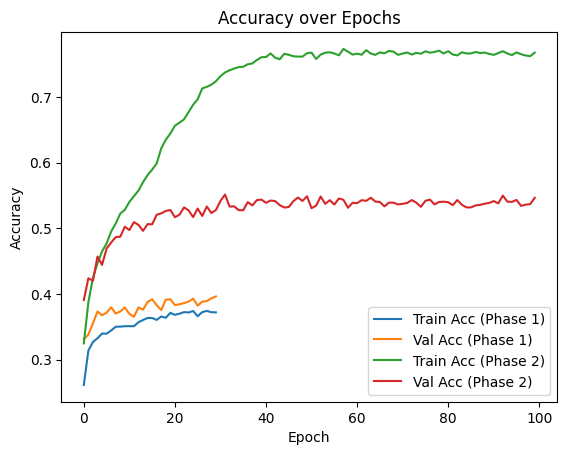

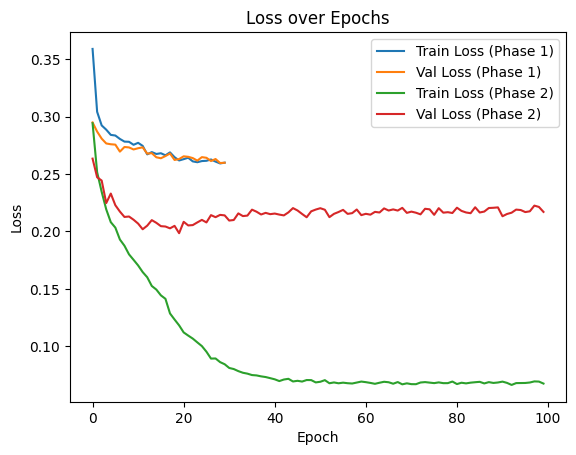

225/225 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - accuracy: 0.5248 - loss: 0.2408

Test Accuracy: 0.5656
Test Loss: 0.2102
225/225 ━━━━━━━━━━━━━━━━━━━━ 6s 18ms/step

Classification Report:
              precision    recall  f1-score   support

       angry       0.44      0.47      0.46       958
     disgust       0.62      0.54      0.58       111
        fear       0.48      0.42      0.45      1024
       happy       0.76      0.70      0.73      1774
     neutral       0.48      0.59      0.53      1233
         sad       0.50      0.41      0.45      1247
    surprise       0.64      0.77      0.70       831

    accuracy                           0.57      7178
   macro avg       0.56      0.56      0.56      7178
weighted avg       0.57      0.57      0.56      7178



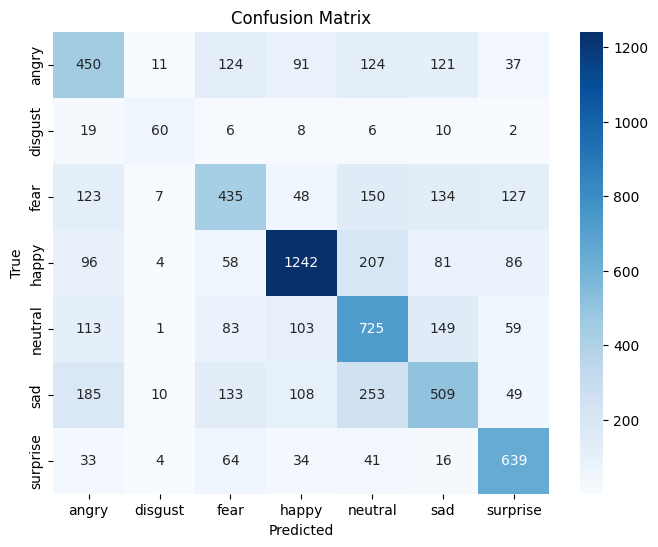

In [ ]:

# ==========  Train with Frozen Base ==========
history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=30,
    class_weight=class_weights_dict,
    callbacks=callbacks
)

# ========== Fine-Tuning ==========
for layer in base_model.layers[-20:]:
    layer.trainable = True

model.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss=focal_loss(gamma=2., alpha=0.25),
    metrics=['accuracy']
)

history_finetune = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=100,
    class_weight=class_weights_dict,
    callbacks=callbacks
)

# ========== 9. Save Final Model ==========
model.save("/content/drive/MyDrive/DL Project/final_model_resnet18_fer2013_focal_loss.h5")

# ========== 10. Plot Accuracy & Loss ==========
plt.plot(history.history['accuracy'], label='Train Acc (Phase 1)')
plt.plot(history.history['val_accuracy'], label='Val Acc (Phase 1)')
plt.plot(history_finetune.history['accuracy'], label='Train Acc (Phase 2)')
plt.plot(history_finetune.history['val_accuracy'], label='Val Acc (Phase 2)')
plt.title('Accuracy over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

plt.plot(history.history['loss'], label='Train Loss (Phase 1)')
plt.plot(history.history['val_loss'], label='Val Loss (Phase 1)')
plt.plot(history_finetune.history['loss'], label='Train Loss (Phase 2)')
plt.plot(history_finetune.history['val_loss'], label='Val Loss (Phase 2)')
plt.title('Loss over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# ========== 11. Evaluate ==========
test_loss, test_acc = model.evaluate(test_generator)
print(f"\nTest Accuracy: {test_acc:.4f}")
print(f"Test Loss: {test_loss:.4f}")

# ========== 12. Classification Report ==========
y_pred_probs = model.predict(test_generator)
y_pred = np.argmax(y_pred_probs, axis=1)
y_true = test_generator.classes
labels = list(test_generator.class_indices.keys())

print("\nClassification Report:")
print(classification_report(y_true, y_pred, target_names=labels))

cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


In [ ]:
class_accuracy = cm.diagonal() / cm.sum(axis=1)

# Print class-wise accuracy
print("\nClass-wise Accuracy:")
for idx, label in enumerate(labels):
    print(f"{label}: {class_accuracy[idx]*100:.2f}%")


Class-wise Accuracy:
angry: 46.97%
disgust: 54.05%
fear: 42.48%
happy: 70.01%
neutral: 58.80%
sad: 40.82%
surprise: 76.90%


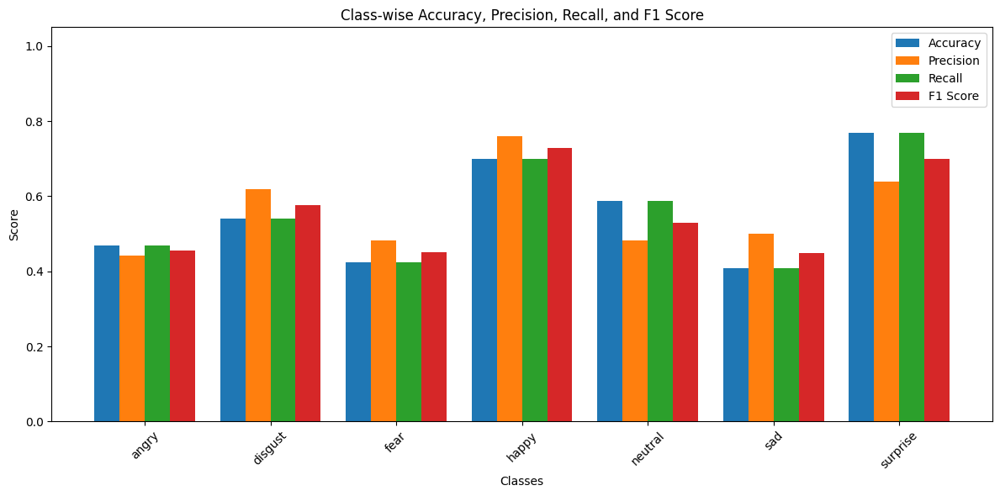

Class-wise Metrics:
angry: Accuracy=0.470, Precision=0.442, Recall=0.470, F1=0.455
disgust: Accuracy=0.541, Precision=0.619, Recall=0.541, F1=0.577
fear: Accuracy=0.425, Precision=0.482, Recall=0.425, F1=0.451
happy: Accuracy=0.700, Precision=0.760, Recall=0.700, F1=0.729
neutral: Accuracy=0.588, Precision=0.481, Recall=0.588, F1=0.529
sad: Accuracy=0.408, Precision=0.499, Recall=0.408, F1=0.449
surprise: Accuracy=0.769, Precision=0.640, Recall=0.769, F1=0.698


In [ ]:

class_accuracy = cm.diagonal() / cm.sum(axis=1)

# Compute precision, recall, f1-score for each class
precision, recall, f1_score, _ = precision_recall_fscore_support(y_true, y_pred, zero_division=0)

# Plotting
x = np.arange(len(labels))
width = 0.2

plt.figure(figsize=(12, 6))

plt.bar(x - 1.5*width, class_accuracy, width, label='Accuracy')
plt.bar(x - 0.5*width, precision, width, label='Precision')
plt.bar(x + 0.5*width, recall, width, label='Recall')
plt.bar(x + 1.5*width, f1_score, width, label='F1 Score')

plt.xticks(x, labels, rotation=45)
plt.ylim([0, 1.05])
plt.xlabel('Classes')
plt.ylabel('Score')
plt.title('Class-wise Accuracy, Precision, Recall, and F1 Score')
plt.legend()
plt.tight_layout()
plt.show()

# Optional: print numeric values
print("Class-wise Metrics:")
for i, label in enumerate(labels):
    print(f"{label}: Accuracy={class_accuracy[i]:.3f}, Precision={precision[i]:.3f}, Recall={recall[i]:.3f}, F1={f1_score[i]:.3f}")